In [1]:
%load_ext autoreload
%autoreload 3

In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina' # high res plotting

import sys
sys.path.append('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam')
sys.path.append(('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/'))
sys.path.append(('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/'))
sys.path.append(('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/shared_helper_modules'))

# General imports
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm
import warnings
import pickle
import glob


warnings.filterwarnings(
    "ignore",
    message="use_inf_as_na option is deprecated",
    category=FutureWarning,
    module="seaborn")

warnings.filterwarnings(
    "ignore",
    message=r"invalid value encountered in log10",
    category=RuntimeWarning,
    module=r".*specparam.*",
)


# NeuroDSP and FOOOF modules
from neurodsp import spectral

from specparam import Bands


# Custom modules

from spk_feat_cluster_analysis import *

from spe1_plotting import *
from spikeparam.patch.fit import Spike

from config import NPX_CHANNELS, CELL_IDS, DICT_PATCH_FS, DICT_CHAN_PRED, DICT_SPK_THRESH, FILTER_SETTINGS, SPE1_DATA_ROOT, SPE1_PICKLE_ROOT


In [3]:
cell_num = 21 #MODIFY THIS WHEN RUNNING DIFFERENT CELLS 

npx_fs = 30000 # sampling rate
lfp_fs = 3500 # sampling rate

patch_fs = DICT_PATCH_FS[cell_num ]
spk_thresh = DICT_SPK_THRESH[cell_num]

npx_channels = NPX_CHANNELS
npx_patch_channel = DICT_CHAN_PRED[cell_num ]



In [4]:
# Parameters
FORCE_CLUSTER = True


### Loading spe-1 data:

I moved the data loading steps to a separate Jupyter Notebook (spe-1_load_data)




## Cell   
### Analyze Gamma LFP and whole patch clamp AP relationship for cell 

## Step 0: Get loaded data 

In [5]:
lfp_dir = os.path.join(SPE1_DATA_ROOT, 'filt_lfp_recordings', f'c{cell_num}_lfp.npy')
patch_dir = os.path.join(SPE1_DATA_ROOT, 'filt_patch_recordings', f'c{cell_num}_patch.npy')


In [6]:
#get LFP data
lfp_filt = np.load(lfp_dir)
lfp_one_ms = float(lfp_fs / 1000)
lfp_times = np.arange(0, np.shape(lfp_filt)[0]) / lfp_one_ms # in ms instead of sec

#get patch data 
patch_filt = np.load(patch_dir)
patch_one_ms = float(patch_fs  / 1000)
patch_times = np.arange(0, np.shape(patch_filt )[0]) / patch_one_ms # in ms instead of sec

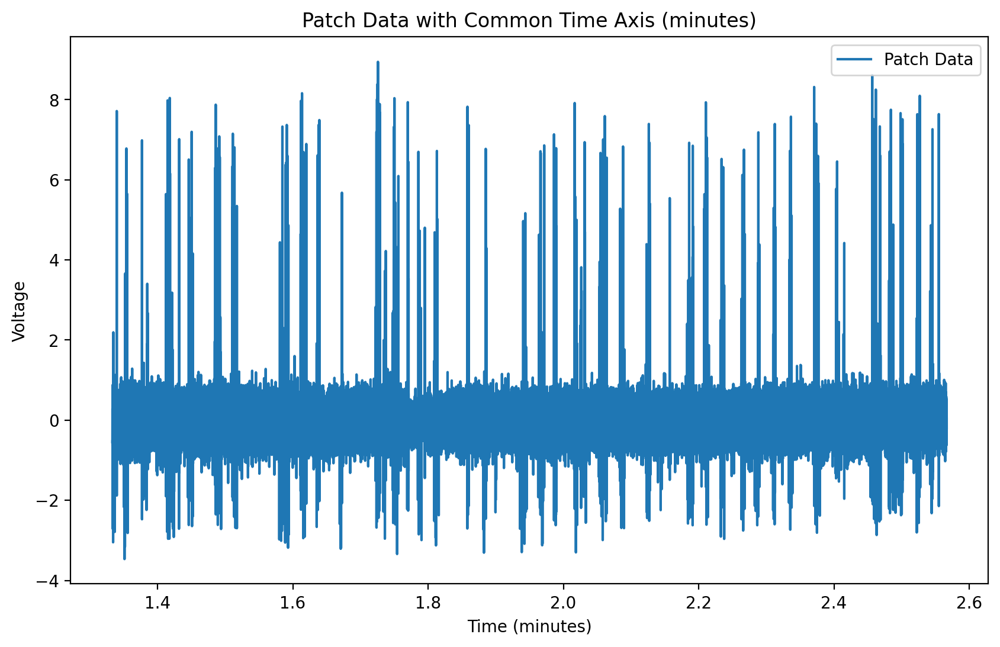

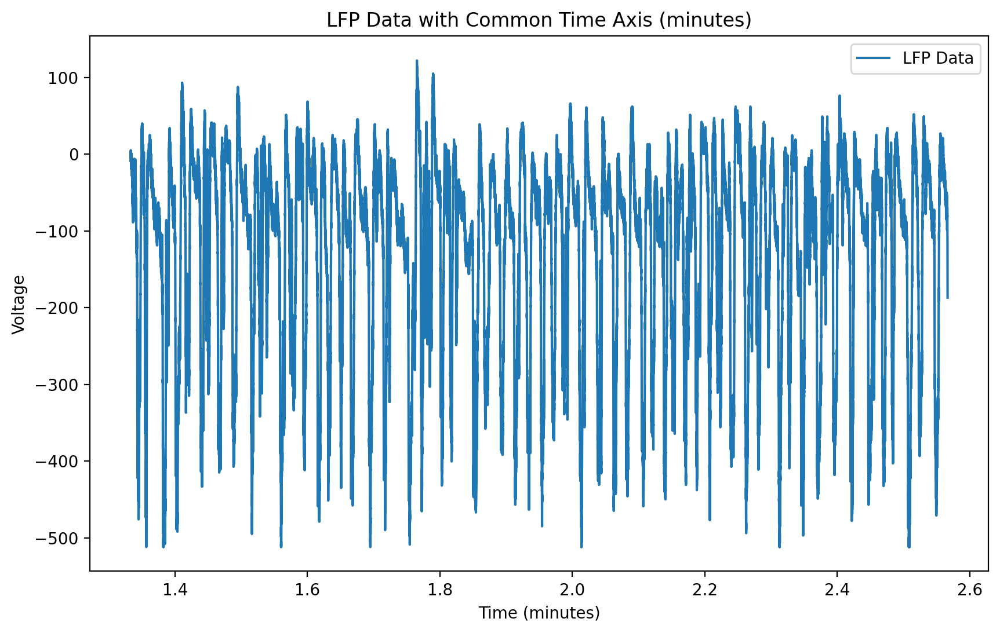

In [7]:
# Plot simultaneous patch and LFP data
# Convert time arrays to minutes
patch_times_min = patch_times / 60000  # Convert milliseconds to minutes
lfp_times_min = lfp_times / 60000  # Convert milliseconds to minutes

# Set the common time axis in minutes (e.g., from 13.3333 to 35.6667 minutes)
common_time_range_min = np.arange(80000 / 60000, 154000 / 60000, 1 / 60000)  # Adjust as needed

# Interpolate patch data onto the common time axis
patch_interp = np.interp(common_time_range_min, patch_times_min, patch_filt)

# Interpolate LFP data onto the common time axis
lfp_interp = np.interp(common_time_range_min, lfp_times_min, lfp_filt)

# Plot patch data with common time axis in minutes
plt.figure(figsize=(10, 6))
plt.plot(common_time_range_min, patch_interp, label='Patch Data')
plt.xlabel('Time (minutes)')
plt.ylabel('Voltage')
plt.title('Patch Data with Common Time Axis (minutes)')
plt.legend()
plt.show()

# Plot LFP data with common time axis in minutes
plt.figure(figsize=(10, 6))
plt.plot(common_time_range_min, lfp_interp, label='LFP Data')
plt.xlabel('Time (minutes)')
plt.ylabel('Voltage')
plt.title('LFP Data with Common Time Axis (minutes)')
plt.legend()
plt.show()

## STEP 1: Detect and fit spikes from patch data

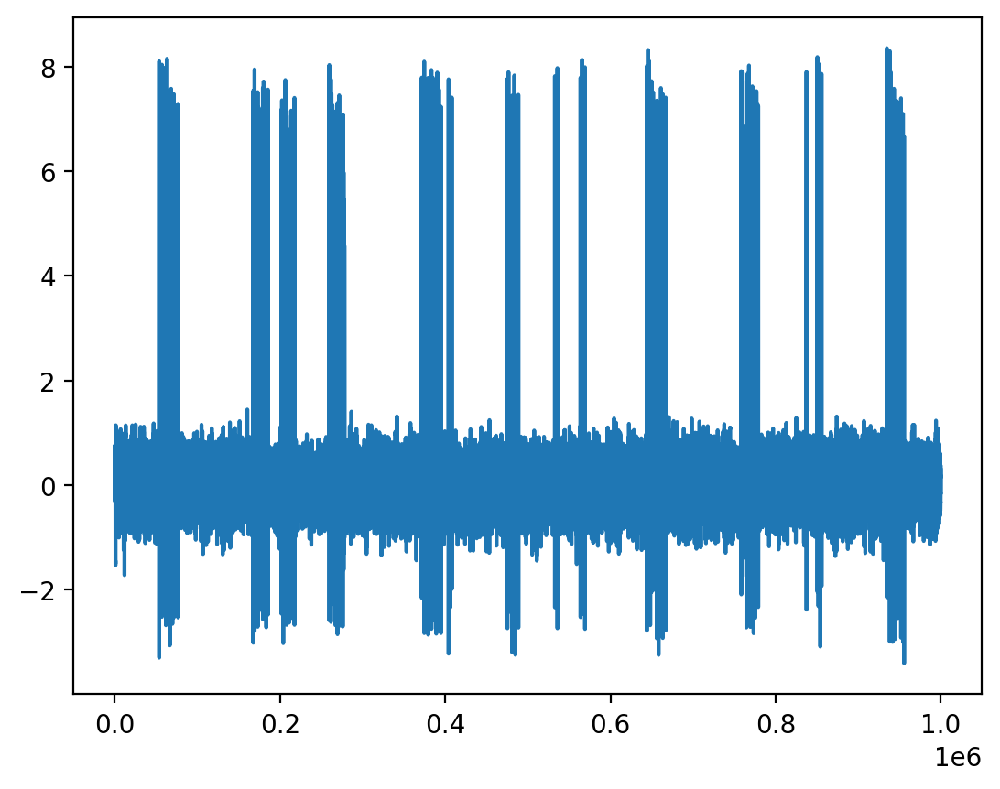

In [8]:
plt.plot(patch_filt[:1000000] )

In [9]:



#threshold in mVs
sp = Spike(thresh_amp=4, window_length=(5., 5.), smooth_frac=.01)

In [10]:
#CHANGE FOR EACH CELL
sp.fit(patch_filt, patch_fs, n_jobs=-1, progress=tqdm, flip_signal=False)

Spike:   0%|          | 0/12561 [00:00<?, ?it/s]

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Spike:   0%|          | 1/12561 [00:06<20:58:00,  6.01s/it]

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


Spike:   0%|          | 8/12561 [00:06<2:02:44,  1.70it/s] 

Spike:   1%|          | 64/12561 [00:06<11:10, 18.63it/s] 

Spike:   1%|          | 88/12561 [00:06<07:30, 27.67it/s]

Spike:   1%|          | 109/12561 [00:06<05:36, 37.06it/s]

Spike:   1%|          | 128/12561 [00:06<04:22, 47.41it/s]

Spike:   1%|          | 146/12561 [00:06<03:29, 59.18it/s]

Spike:   1%|▏         | 164/12561 [00:07<02:50, 72.67it/s]

Spike:   1%|▏         | 182/12561 [00:07<02:22, 87.12it/s]

Spike:   2%|▏         | 200/12561 [00:07<02:08, 96.37it/s]

Spike:   2%|▏         | 220/12561 [00:07<01:47, 115.29it/s]

Spike:   2%|▏         | 238/12561 [00:07<01:38, 125.56it/s]

Spike:   2%|▏         | 256/12561 [00:07<01:33, 131.29it/s]

Spike:   2%|▏         | 275/12561 [00:07<01:25, 143.98it/s]

Spike:   2%|▏         | 294/12561 [00:07<01:21, 149.69it/s]

Spike:   2%|▏         | 312/12561 [00:07<01:20, 152.72it/s]

Spike:   3%|▎         | 329/12561 [00:08<01:19, 153.97it/s]

Spike:   3%|▎         | 349/12561 [00:08<01:14, 164.76it/s]

Spike:   3%|▎         | 368/12561 [00:08<01:15, 162.43it/s]

Spike:   3%|▎         | 385/12561 [00:08<01:17, 157.78it/s]

Spike:   3%|▎         | 407/12561 [00:08<01:16, 157.88it/s]

Spike:   3%|▎         | 424/12561 [00:08<01:15, 160.58it/s]

Spike:   4%|▎         | 445/12561 [00:08<01:10, 171.41it/s]

Spike:   4%|▎         | 463/12561 [00:08<01:14, 162.22it/s]

Spike:   4%|▍         | 482/12561 [00:08<01:14, 161.25it/s]

Spike:   4%|▍         | 499/12561 [00:09<01:18, 153.98it/s]

Spike:   4%|▍         | 523/12561 [00:09<01:09, 172.80it/s]

Spike:   4%|▍         | 542/12561 [00:09<01:08, 176.27it/s]

Spike:   4%|▍         | 560/12561 [00:09<01:09, 172.50it/s]

Spike:   5%|▍         | 578/12561 [00:09<01:12, 165.43it/s]

Spike:   5%|▍         | 595/12561 [00:09<01:13, 163.83it/s]

Spike:   5%|▍         | 612/12561 [00:09<01:12, 165.05it/s]

Spike:   5%|▌         | 632/12561 [00:09<01:08, 174.80it/s]

Spike:   5%|▌         | 650/12561 [00:09<01:09, 170.76it/s]

Spike:   5%|▌         | 668/12561 [00:10<01:10, 168.79it/s]

Spike:   5%|▌         | 686/12561 [00:10<01:11, 165.62it/s]

Spike:   6%|▌         | 703/12561 [00:10<01:11, 165.71it/s]

Spike:   6%|▌         | 722/12561 [00:10<01:12, 162.35it/s]

Spike:   6%|▌         | 741/12561 [00:10<01:11, 165.73it/s]

Spike:   6%|▌         | 758/12561 [00:10<01:11, 164.82it/s]

Spike:   6%|▌         | 777/12561 [00:10<01:08, 171.33it/s]

Spike:   6%|▋         | 795/12561 [00:10<01:11, 165.32it/s]

Spike:   6%|▋         | 812/12561 [00:10<01:10, 166.08it/s]

Spike:   7%|▋         | 831/12561 [00:11<01:08, 170.77it/s]

Spike:   7%|▋         | 849/12561 [00:11<01:11, 162.73it/s]

Spike:   7%|▋         | 869/12561 [00:11<01:07, 173.06it/s]

Spike:   7%|▋         | 887/12561 [00:11<01:11, 162.44it/s]

Spike:   7%|▋         | 906/12561 [00:11<01:09, 168.33it/s]

Spike:   7%|▋         | 924/12561 [00:11<01:12, 161.04it/s]

Spike:   8%|▊         | 945/12561 [00:11<01:06, 174.15it/s]

Spike:   8%|▊         | 963/12561 [00:11<01:10, 163.79it/s]

Spike:   8%|▊         | 981/12561 [00:11<01:09, 167.09it/s]

Spike:   8%|▊         | 998/12561 [00:12<01:11, 161.13it/s]

Spike:   8%|▊         | 1018/12561 [00:12<01:08, 167.56it/s]

Spike:   8%|▊         | 1035/12561 [00:12<01:09, 166.87it/s]

Spike:   8%|▊         | 1052/12561 [00:12<01:09, 166.35it/s]

Spike:   9%|▊         | 1069/12561 [00:12<01:11, 161.22it/s]

Spike:   9%|▊         | 1090/12561 [00:12<01:06, 172.59it/s]

Spike:   9%|▉         | 1108/12561 [00:12<01:10, 162.93it/s]

Spike:   9%|▉         | 1125/12561 [00:12<01:09, 164.40it/s]

Spike:   9%|▉         | 1142/12561 [00:12<01:10, 162.38it/s]

Spike:   9%|▉         | 1164/12561 [00:13<01:06, 171.02it/s]

Spike:   9%|▉         | 1182/12561 [00:13<01:10, 160.93it/s]

Spike:  10%|▉         | 1203/12561 [00:13<01:05, 172.85it/s]

Spike:  10%|▉         | 1221/12561 [00:13<01:07, 167.78it/s]

Spike:  10%|▉         | 1238/12561 [00:13<01:07, 167.47it/s]

Spike:  10%|▉         | 1255/12561 [00:13<01:07, 167.35it/s]

Spike:  10%|█         | 1272/12561 [00:13<01:08, 164.90it/s]

Spike:  10%|█         | 1291/12561 [00:13<01:08, 164.47it/s]

Spike:  10%|█         | 1308/12561 [00:13<01:08, 163.68it/s]

Spike:  11%|█         | 1326/12561 [00:14<01:07, 165.74it/s]

Spike:  11%|█         | 1343/12561 [00:14<01:08, 163.75it/s]

Spike:  11%|█         | 1363/12561 [00:14<01:05, 170.30it/s]

Spike:  11%|█         | 1381/12561 [00:14<01:06, 169.25it/s]

Spike:  11%|█         | 1399/12561 [00:14<01:05, 171.18it/s]

Spike:  11%|█▏        | 1417/12561 [00:14<01:05, 170.63it/s]

Spike:  11%|█▏        | 1435/12561 [00:14<01:08, 163.50it/s]

Spike:  12%|█▏        | 1453/12561 [00:14<01:08, 162.09it/s]

Spike:  12%|█▏        | 1475/12561 [00:14<01:05, 168.44it/s]

Spike:  12%|█▏        | 1494/12561 [00:15<01:03, 174.24it/s]

Spike:  12%|█▏        | 1512/12561 [00:15<01:07, 164.65it/s]

Spike:  12%|█▏        | 1531/12561 [00:15<01:06, 165.96it/s]

Spike:  12%|█▏        | 1549/12561 [00:15<01:06, 166.68it/s]

Spike:  12%|█▏        | 1567/12561 [00:15<01:05, 166.92it/s]

Spike:  13%|█▎        | 1586/12561 [00:15<01:04, 169.32it/s]

Spike:  13%|█▎        | 1603/12561 [00:15<01:09, 158.47it/s]

Spike:  13%|█▎        | 1620/12561 [00:15<01:08, 160.67it/s]

Spike:  13%|█▎        | 1641/12561 [00:15<01:05, 166.33it/s]

Spike:  13%|█▎        | 1663/12561 [00:16<01:02, 175.60it/s]

Spike:  13%|█▎        | 1681/12561 [00:16<01:04, 169.50it/s]

Spike:  14%|█▎        | 1699/12561 [00:16<01:04, 169.57it/s]

Spike:  14%|█▎        | 1717/12561 [00:16<01:04, 167.07it/s]

Spike:  14%|█▍        | 1735/12561 [00:16<01:08, 157.28it/s]

Spike:  14%|█▍        | 1751/12561 [00:16<01:10, 153.70it/s]

Spike:  14%|█▍        | 1770/12561 [00:16<01:13, 147.74it/s]

Spike:  14%|█▍        | 1799/12561 [00:16<01:00, 176.98it/s]

Spike:  14%|█▍        | 1817/12561 [00:16<01:00, 176.20it/s]

Spike:  15%|█▍        | 1835/12561 [00:17<01:03, 168.44it/s]

Spike:  15%|█▍        | 1855/12561 [00:17<01:03, 167.38it/s]

Spike:  15%|█▍        | 1874/12561 [00:17<01:01, 172.41it/s]

Spike:  15%|█▌        | 1893/12561 [00:17<01:00, 176.49it/s]

Spike:  15%|█▌        | 1911/12561 [00:17<01:03, 168.61it/s]

Spike:  15%|█▌        | 1928/12561 [00:17<01:08, 154.62it/s]

Spike:  16%|█▌        | 1953/12561 [00:17<01:01, 172.33it/s]

Spike:  16%|█▌        | 1971/12561 [00:17<01:02, 169.88it/s]

Spike:  16%|█▌        | 1989/12561 [00:18<01:02, 169.84it/s]

Spike:  16%|█▌        | 2007/12561 [00:18<01:01, 171.29it/s]

Spike:  16%|█▌        | 2025/12561 [00:18<01:02, 167.35it/s]

Spike:  16%|█▋        | 2043/12561 [00:18<01:05, 161.54it/s]

Spike:  16%|█▋        | 2063/12561 [00:18<01:02, 168.98it/s]

Spike:  17%|█▋        | 2082/12561 [00:18<01:00, 173.84it/s]

Spike:  17%|█▋        | 2100/12561 [00:18<01:03, 164.63it/s]

Spike:  17%|█▋        | 2121/12561 [00:18<00:59, 176.65it/s]

Spike:  17%|█▋        | 2139/12561 [00:18<01:06, 156.71it/s]

Spike:  17%|█▋        | 2160/12561 [00:19<01:01, 169.61it/s]

Spike:  17%|█▋        | 2178/12561 [00:19<01:03, 162.67it/s]

Spike:  17%|█▋        | 2198/12561 [00:19<01:01, 169.14it/s]

Spike:  18%|█▊        | 2216/12561 [00:19<01:07, 153.81it/s]

Spike:  18%|█▊        | 2238/12561 [00:19<01:01, 166.72it/s]

Spike:  18%|█▊        | 2256/12561 [00:19<01:10, 145.34it/s]

Spike:  18%|█▊        | 2282/12561 [00:19<00:59, 171.99it/s]

Spike:  18%|█▊        | 2301/12561 [00:19<01:00, 169.72it/s]

Spike:  18%|█▊        | 2319/12561 [00:20<01:06, 153.68it/s]

Spike:  19%|█▊        | 2336/12561 [00:20<01:06, 154.68it/s]

Spike:  19%|█▉        | 2357/12561 [00:20<01:00, 168.26it/s]

Spike:  19%|█▉        | 2375/12561 [00:20<01:01, 165.30it/s]

Spike:  19%|█▉        | 2392/12561 [00:20<01:01, 166.15it/s]

Spike:  19%|█▉        | 2411/12561 [00:20<00:59, 171.49it/s]

Spike:  19%|█▉        | 2429/12561 [00:20<00:59, 168.88it/s]

Spike:  19%|█▉        | 2447/12561 [00:20<00:59, 168.87it/s]

Spike:  20%|█▉        | 2464/12561 [00:20<01:00, 167.37it/s]

Spike:  20%|█▉        | 2481/12561 [00:20<01:00, 165.42it/s]

Spike:  20%|█▉        | 2499/12561 [00:21<00:59, 169.02it/s]

Spike:  20%|██        | 2516/12561 [00:21<01:00, 165.42it/s]

Spike:  20%|██        | 2536/12561 [00:21<01:01, 162.73it/s]

Spike:  20%|██        | 2557/12561 [00:21<01:02, 160.97it/s]

Spike:  20%|██        | 2575/12561 [00:21<01:00, 164.86it/s]

Spike:  21%|██        | 2596/12561 [00:21<00:58, 171.77it/s]

Spike:  21%|██        | 2614/12561 [00:21<00:59, 168.52it/s]

Spike:  21%|██        | 2631/12561 [00:21<00:58, 168.88it/s]

Spike:  21%|██        | 2649/12561 [00:22<01:00, 164.85it/s]

Spike:  21%|██        | 2666/12561 [00:22<01:00, 163.42it/s]

Spike:  21%|██▏       | 2683/12561 [00:22<01:08, 144.47it/s]

Spike:  22%|██▏       | 2706/12561 [00:22<01:04, 152.53it/s]

Spike:  22%|██▏       | 2722/12561 [00:22<01:05, 150.73it/s]

Spike:  22%|██▏       | 2747/12561 [00:22<00:57, 170.04it/s]

Spike:  22%|██▏       | 2769/12561 [00:22<00:56, 174.65it/s]

Spike:  22%|██▏       | 2787/12561 [00:22<00:55, 175.13it/s]

Spike:  22%|██▏       | 2805/12561 [00:22<00:56, 172.86it/s]

Spike:  22%|██▏       | 2823/12561 [00:23<00:57, 170.80it/s]

Spike:  23%|██▎       | 2841/12561 [00:23<00:56, 171.55it/s]

Spike:  23%|██▎       | 2859/12561 [00:23<00:57, 168.82it/s]

Spike:  23%|██▎       | 2879/12561 [00:23<00:56, 170.10it/s]

Spike:  23%|██▎       | 2897/12561 [00:23<00:57, 169.50it/s]

Spike:  23%|██▎       | 2915/12561 [00:23<00:56, 171.53it/s]

Spike:  23%|██▎       | 2933/12561 [00:23<01:02, 154.71it/s]

Spike:  24%|██▎       | 2955/12561 [00:23<00:56, 168.71it/s]

Spike:  24%|██▎       | 2973/12561 [00:23<00:57, 165.60it/s]

Spike:  24%|██▍       | 2990/12561 [00:24<00:57, 166.51it/s]

Spike:  24%|██▍       | 3010/12561 [00:24<00:56, 168.83it/s]

Spike:  24%|██▍       | 3028/12561 [00:24<00:55, 171.40it/s]

Spike:  24%|██▍       | 3046/12561 [00:24<00:55, 170.96it/s]

Spike:  24%|██▍       | 3064/12561 [00:24<00:57, 164.30it/s]

Spike:  25%|██▍       | 3081/12561 [00:24<00:59, 160.32it/s]

Spike:  25%|██▍       | 3102/12561 [00:24<00:57, 165.31it/s]

Spike:  25%|██▍       | 3119/12561 [00:24<00:59, 158.48it/s]

Spike:  25%|██▍       | 3138/12561 [00:24<00:56, 165.52it/s]

Spike:  25%|██▌       | 3155/12561 [00:25<00:57, 164.49it/s]

Spike:  25%|██▌       | 3173/12561 [00:25<00:56, 165.09it/s]

Spike:  25%|██▌       | 3191/12561 [00:25<00:57, 162.83it/s]

Spike:  26%|██▌       | 3208/12561 [00:25<00:59, 157.60it/s]

Spike:  26%|██▌       | 3230/12561 [00:25<00:54, 169.83it/s]

Spike:  26%|██▌       | 3248/12561 [00:25<00:55, 167.33it/s]

Spike:  26%|██▌       | 3265/12561 [00:25<00:59, 154.94it/s]

Spike:  26%|██▌       | 3287/12561 [00:25<00:54, 169.74it/s]

Spike:  26%|██▋       | 3305/12561 [00:25<00:56, 163.97it/s]

Spike:  26%|██▋       | 3323/12561 [00:26<00:55, 167.03it/s]

Spike:  27%|██▋       | 3340/12561 [00:26<00:56, 164.49it/s]

Spike:  27%|██▋       | 3358/12561 [00:26<00:55, 166.81it/s]

Spike:  27%|██▋       | 3375/12561 [00:26<01:02, 147.73it/s]

Spike:  27%|██▋       | 3398/12561 [00:26<00:54, 167.39it/s]

Spike:  27%|██▋       | 3416/12561 [00:26<00:58, 155.83it/s]

Spike:  27%|██▋       | 3434/12561 [00:26<00:57, 158.46it/s]

Spike:  27%|██▋       | 3452/12561 [00:26<00:56, 162.17it/s]

Spike:  28%|██▊       | 3471/12561 [00:27<00:55, 163.86it/s]

Spike:  28%|██▊       | 3488/12561 [00:27<00:57, 157.60it/s]

Spike:  28%|██▊       | 3506/12561 [00:27<01:02, 144.08it/s]

Spike:  28%|██▊       | 3523/12561 [00:27<01:00, 148.30it/s]

Spike:  28%|██▊       | 3545/12561 [00:27<00:55, 163.63it/s]

Spike:  28%|██▊       | 3562/12561 [00:27<00:57, 157.00it/s]

Spike:  28%|██▊       | 3579/12561 [00:27<00:57, 156.32it/s]

Spike:  29%|██▊       | 3596/12561 [00:27<00:56, 159.24it/s]

Spike:  29%|██▉       | 3613/12561 [00:27<00:58, 153.91it/s]

Spike:  29%|██▉       | 3629/12561 [00:28<00:58, 152.17it/s]

Spike:  29%|██▉       | 3647/12561 [00:28<00:57, 154.65it/s]

Spike:  29%|██▉       | 3663/12561 [00:28<00:58, 152.60it/s]

Spike:  29%|██▉       | 3681/12561 [00:28<00:55, 159.83it/s]

Spike:  29%|██▉       | 3698/12561 [00:28<00:58, 151.30it/s]

Spike:  30%|██▉       | 3715/12561 [00:28<00:57, 155.19it/s]

Spike:  30%|██▉       | 3731/12561 [00:28<00:59, 148.41it/s]

Spike:  30%|██▉       | 3747/12561 [00:28<00:58, 149.58it/s]

Spike:  30%|██▉       | 3763/12561 [00:28<00:59, 148.77it/s]

Spike:  30%|███       | 3779/12561 [00:29<01:01, 143.19it/s]

Spike:  30%|███       | 3794/12561 [00:29<01:15, 116.58it/s]

Spike:  30%|███       | 3822/12561 [00:29<00:57, 153.00it/s]

Spike:  31%|███       | 3839/12561 [00:29<01:00, 144.01it/s]

Spike:  31%|███       | 3855/12561 [00:29<01:02, 139.42it/s]

Spike:  31%|███       | 3871/12561 [00:29<01:01, 141.70it/s]

Spike:  31%|███       | 3888/12561 [00:29<01:00, 143.92it/s]

Spike:  31%|███       | 3903/12561 [00:29<01:00, 143.20it/s]

Spike:  31%|███       | 3918/12561 [00:30<01:00, 142.17it/s]

Spike:  31%|███▏      | 3934/12561 [00:30<00:59, 145.14it/s]

Spike:  31%|███▏      | 3949/12561 [00:30<00:59, 143.54it/s]

Spike:  32%|███▏      | 3964/12561 [00:30<01:01, 138.74it/s]

Spike:  32%|███▏      | 3979/12561 [00:30<01:01, 139.90it/s]

Spike:  32%|███▏      | 3994/12561 [00:30<01:04, 132.64it/s]

Spike:  32%|███▏      | 4012/12561 [00:30<01:00, 140.39it/s]

Spike:  32%|███▏      | 4027/12561 [00:30<01:02, 136.98it/s]

Spike:  32%|███▏      | 4041/12561 [00:31<01:12, 117.58it/s]

Spike:  32%|███▏      | 4062/12561 [00:31<01:07, 126.73it/s]

Spike:  33%|███▎      | 4086/12561 [00:31<00:56, 149.92it/s]

Spike:  33%|███▎      | 4102/12561 [00:31<00:58, 145.41it/s]

Spike:  33%|███▎      | 4117/12561 [00:31<00:59, 142.62it/s]

Spike:  33%|███▎      | 4132/12561 [00:31<00:59, 141.41it/s]

Spike:  33%|███▎      | 4148/12561 [00:31<00:59, 141.84it/s]

Spike:  33%|███▎      | 4163/12561 [00:31<01:02, 134.62it/s]

Spike:  33%|███▎      | 4177/12561 [00:31<01:04, 130.55it/s]

Spike:  33%|███▎      | 4191/12561 [00:32<01:08, 122.18it/s]

Spike:  34%|███▎      | 4209/12561 [00:32<01:03, 131.27it/s]

Spike:  34%|███▎      | 4223/12561 [00:32<01:04, 130.20it/s]

Spike:  34%|███▎      | 4237/12561 [00:32<01:03, 130.66it/s]

Spike:  34%|███▍      | 4251/12561 [00:32<01:02, 132.65it/s]

Spike:  34%|███▍      | 4265/12561 [00:32<01:02, 133.80it/s]

Spike:  34%|███▍      | 4279/12561 [00:32<01:06, 124.44it/s]

Spike:  34%|███▍      | 4293/12561 [00:32<01:05, 126.66it/s]

Spike:  34%|███▍      | 4307/12561 [00:32<01:03, 130.26it/s]

Spike:  34%|███▍      | 4321/12561 [00:33<01:03, 129.99it/s]

Spike:  35%|███▍      | 4335/12561 [00:33<01:05, 126.11it/s]

Spike:  35%|███▍      | 4348/12561 [00:33<01:05, 125.54it/s]

Spike:  35%|███▍      | 4362/12561 [00:33<01:05, 125.68it/s]

Spike:  35%|███▍      | 4375/12561 [00:33<01:13, 111.36it/s]

Spike:  35%|███▍      | 4391/12561 [00:33<01:06, 123.70it/s]

Spike:  35%|███▌      | 4405/12561 [00:33<01:04, 127.12it/s]

Spike:  35%|███▌      | 4419/12561 [00:33<01:06, 123.12it/s]

Spike:  35%|███▌      | 4432/12561 [00:33<01:06, 122.35it/s]

Spike:  35%|███▌      | 4445/12561 [00:34<01:06, 121.53it/s]

Spike:  35%|███▌      | 4458/12561 [00:34<01:09, 116.73it/s]

Spike:  36%|███▌      | 4471/12561 [00:34<01:09, 116.83it/s]

Spike:  36%|███▌      | 4484/12561 [00:34<01:07, 119.58it/s]

Spike:  36%|███▌      | 4497/12561 [00:34<01:09, 116.05it/s]

Spike:  36%|███▌      | 4509/12561 [00:34<01:10, 114.90it/s]

Spike:  36%|███▌      | 4521/12561 [00:34<01:10, 114.08it/s]

Spike:  36%|███▌      | 4533/12561 [00:34<01:29, 89.55it/s] 

Spike:  36%|███▌      | 4552/12561 [00:35<01:10, 113.08it/s]

Spike:  36%|███▋      | 4565/12561 [00:35<01:10, 113.46it/s]

Spike:  36%|███▋      | 4578/12561 [00:35<01:15, 106.22it/s]

Spike:  37%|███▋      | 4593/12561 [00:35<01:10, 112.71it/s]

Spike:  37%|███▋      | 4607/12561 [00:35<01:07, 117.85it/s]

Spike:  37%|███▋      | 4620/12561 [00:35<01:15, 104.91it/s]

Spike:  37%|███▋      | 4634/12561 [00:35<01:10, 112.04it/s]

Spike:  37%|███▋      | 4646/12561 [00:35<01:13, 108.26it/s]

Spike:  37%|███▋      | 4659/12561 [00:36<01:22, 96.15it/s] 

Spike:  37%|███▋      | 4676/12561 [00:36<01:10, 112.09it/s]

Spike:  37%|███▋      | 4688/12561 [00:36<01:27, 90.24it/s] 

Spike:  37%|███▋      | 4709/12561 [00:36<01:07, 116.10it/s]

Spike:  38%|███▊      | 4723/12561 [00:36<01:12, 108.85it/s]

Spike:  38%|███▊      | 4736/12561 [00:36<01:09, 112.56it/s]

Spike:  38%|███▊      | 4749/12561 [00:36<01:12, 108.31it/s]

Spike:  38%|███▊      | 4762/12561 [00:37<01:13, 106.17it/s]

Spike:  38%|███▊      | 4774/12561 [00:37<01:17, 100.54it/s]

Spike:  38%|███▊      | 4787/12561 [00:37<01:12, 106.84it/s]

Spike:  38%|███▊      | 4799/12561 [00:37<01:13, 106.04it/s]

Spike:  38%|███▊      | 4810/12561 [00:37<01:13, 106.11it/s]

Spike:  38%|███▊      | 4821/12561 [00:37<01:17, 99.72it/s] 

Spike:  38%|███▊      | 4834/12561 [00:37<01:16, 100.50it/s]

Spike:  39%|███▊      | 4845/12561 [00:37<01:16, 100.44it/s]

Spike:  39%|███▊      | 4856/12561 [00:37<01:17, 99.13it/s] 

Spike:  39%|███▉      | 4868/12561 [00:38<01:18, 98.55it/s]

Spike:  39%|███▉      | 4881/12561 [00:38<01:14, 103.11it/s]

Spike:  39%|███▉      | 4892/12561 [00:38<01:16, 100.31it/s]

Spike:  39%|███▉      | 4904/12561 [00:38<01:15, 100.84it/s]

Spike:  39%|███▉      | 4916/12561 [00:38<01:19, 96.50it/s] 

Spike:  39%|███▉      | 4928/12561 [00:38<01:14, 102.02it/s]

Spike:  39%|███▉      | 4939/12561 [00:38<01:18, 96.83it/s] 

Spike:  39%|███▉      | 4949/12561 [00:38<01:21, 93.22it/s]

Spike:  39%|███▉      | 4959/12561 [00:39<01:21, 93.19it/s]

Spike:  40%|███▉      | 4970/12561 [00:39<01:18, 96.64it/s]

Spike:  40%|███▉      | 4983/12561 [00:39<01:15, 100.78it/s]

Spike:  40%|███▉      | 4994/12561 [00:39<01:17, 97.88it/s] 

Spike:  40%|███▉      | 5004/12561 [00:39<01:20, 93.95it/s]

Spike:  40%|███▉      | 5014/12561 [00:39<01:30, 83.25it/s]

Spike:  40%|████      | 5027/12561 [00:39<01:19, 94.20it/s]

Spike:  40%|████      | 5038/12561 [00:39<01:19, 94.50it/s]

Spike:  40%|████      | 5048/12561 [00:39<01:18, 95.77it/s]

Spike:  40%|████      | 5059/12561 [00:40<01:15, 99.66it/s]

Spike:  40%|████      | 5070/12561 [00:40<01:23, 89.41it/s]

Spike:  40%|████      | 5082/12561 [00:40<01:18, 94.72it/s]

Spike:  41%|████      | 5092/12561 [00:40<01:20, 93.02it/s]

Spike:  41%|████      | 5102/12561 [00:40<01:18, 94.82it/s]

Spike:  41%|████      | 5112/12561 [00:40<01:18, 94.30it/s]

Spike:  41%|████      | 5122/12561 [00:40<01:18, 94.55it/s]

Spike:  41%|████      | 5134/12561 [00:40<01:15, 98.72it/s]

Spike:  41%|████      | 5144/12561 [00:40<01:19, 93.07it/s]

Spike:  41%|████      | 5154/12561 [00:41<01:18, 94.32it/s]

Spike:  41%|████      | 5165/12561 [00:41<01:15, 97.37it/s]

Spike:  41%|████      | 5175/12561 [00:41<01:23, 88.65it/s]

Spike:  41%|████▏     | 5185/12561 [00:41<01:27, 84.25it/s]

Spike:  41%|████▏     | 5199/12561 [00:41<01:15, 97.28it/s]

Spike:  41%|████▏     | 5209/12561 [00:41<01:18, 93.46it/s]

Spike:  42%|████▏     | 5222/12561 [00:41<01:22, 88.91it/s]

Spike:  42%|████▏     | 5233/12561 [00:41<01:18, 93.84it/s]

Spike:  42%|████▏     | 5243/12561 [00:42<01:17, 94.06it/s]

Spike:  42%|████▏     | 5253/12561 [00:42<01:18, 93.34it/s]

Spike:  42%|████▏     | 5263/12561 [00:42<01:25, 85.84it/s]

Spike:  42%|████▏     | 5272/12561 [00:42<01:24, 86.71it/s]

Spike:  42%|████▏     | 5282/12561 [00:42<01:24, 86.49it/s]

Spike:  42%|████▏     | 5291/12561 [00:42<01:27, 83.47it/s]

Spike:  42%|████▏     | 5300/12561 [00:42<01:31, 79.66it/s]

Spike:  42%|████▏     | 5309/12561 [00:42<01:31, 79.43it/s]

Spike:  42%|████▏     | 5318/12561 [00:42<01:28, 81.47it/s]

Spike:  42%|████▏     | 5327/12561 [00:43<01:33, 76.99it/s]

Spike:  42%|████▏     | 5337/12561 [00:43<01:32, 78.22it/s]

Spike:  43%|████▎     | 5346/12561 [00:43<01:30, 79.70it/s]

Spike:  43%|████▎     | 5355/12561 [00:43<01:29, 80.22it/s]

Spike:  43%|████▎     | 5364/12561 [00:43<01:28, 81.62it/s]

Spike:  43%|████▎     | 5373/12561 [00:43<01:33, 77.17it/s]

Spike:  43%|████▎     | 5381/12561 [00:43<01:32, 77.57it/s]

Spike:  43%|████▎     | 5391/12561 [00:43<01:29, 80.28it/s]

Spike:  43%|████▎     | 5401/12561 [00:44<01:30, 79.30it/s]

Spike:  43%|████▎     | 5410/12561 [00:44<01:28, 80.75it/s]

Spike:  43%|████▎     | 5419/12561 [00:44<01:33, 76.31it/s]

Spike:  43%|████▎     | 5429/12561 [00:44<01:37, 72.93it/s]

Spike:  43%|████▎     | 5437/12561 [00:44<01:37, 73.08it/s]

Spike:  43%|████▎     | 5446/12561 [00:44<01:32, 76.76it/s]

Spike:  43%|████▎     | 5454/12561 [00:44<01:36, 73.42it/s]

Spike:  43%|████▎     | 5462/12561 [00:44<01:38, 72.22it/s]

Spike:  44%|████▎     | 5471/12561 [00:45<01:37, 73.07it/s]

Spike:  44%|████▎     | 5485/12561 [00:45<01:27, 80.91it/s]

Spike:  44%|████▎     | 5494/12561 [00:45<01:29, 78.69it/s]

Spike:  44%|████▍     | 5502/12561 [00:45<01:32, 76.32it/s]

Spike:  44%|████▍     | 5516/12561 [00:45<01:18, 90.15it/s]

Spike:  44%|████▍     | 5526/12561 [00:45<01:18, 89.38it/s]

Spike:  44%|████▍     | 5535/12561 [00:45<01:24, 83.63it/s]

Spike:  44%|████▍     | 5547/12561 [00:45<01:15, 93.16it/s]

Spike:  44%|████▍     | 5557/12561 [00:45<01:15, 93.18it/s]

Spike:  44%|████▍     | 5567/12561 [00:46<01:30, 77.26it/s]

Spike:  44%|████▍     | 5582/12561 [00:46<01:17, 89.99it/s]

Spike:  45%|████▍     | 5592/12561 [00:46<01:20, 86.82it/s]

Spike:  45%|████▍     | 5602/12561 [00:46<01:17, 89.98it/s]

Spike:  45%|████▍     | 5612/12561 [00:46<01:15, 92.59it/s]

Spike:  45%|████▍     | 5622/12561 [00:46<01:20, 85.98it/s]

Spike:  45%|████▍     | 5632/12561 [00:46<01:19, 87.33it/s]

Spike:  45%|████▍     | 5644/12561 [00:46<01:13, 94.52it/s]

Spike:  45%|████▌     | 5654/12561 [00:47<01:17, 88.70it/s]

Spike:  45%|████▌     | 5664/12561 [00:47<01:17, 88.46it/s]

Spike:  45%|████▌     | 5673/12561 [00:47<01:18, 88.18it/s]

Spike:  45%|████▌     | 5682/12561 [00:47<01:19, 86.81it/s]

Spike:  45%|████▌     | 5693/12561 [00:47<01:15, 90.55it/s]

Spike:  45%|████▌     | 5703/12561 [00:47<01:16, 89.28it/s]

Spike:  45%|████▌     | 5713/12561 [00:47<01:14, 92.12it/s]

Spike:  46%|████▌     | 5723/12561 [00:47<01:13, 93.23it/s]

Spike:  46%|████▌     | 5733/12561 [00:47<01:16, 89.67it/s]

Spike:  46%|████▌     | 5743/12561 [00:48<01:16, 89.56it/s]

Spike:  46%|████▌     | 5753/12561 [00:48<01:15, 90.31it/s]

Spike:  46%|████▌     | 5763/12561 [00:48<01:18, 87.09it/s]

Spike:  46%|████▌     | 5774/12561 [00:48<01:13, 92.92it/s]

Spike:  46%|████▌     | 5784/12561 [00:48<01:14, 91.06it/s]

Spike:  46%|████▌     | 5794/12561 [00:48<01:17, 87.20it/s]

Spike:  46%|████▌     | 5803/12561 [00:48<01:19, 84.55it/s]

Spike:  46%|████▋     | 5816/12561 [00:48<01:12, 92.62it/s]

Spike:  46%|████▋     | 5826/12561 [00:48<01:15, 89.74it/s]

Spike:  46%|████▋     | 5837/12561 [00:49<01:11, 94.45it/s]

Spike:  47%|████▋     | 5847/12561 [00:49<01:12, 93.11it/s]

Spike:  47%|████▋     | 5857/12561 [00:49<01:14, 90.56it/s]

Spike:  47%|████▋     | 5867/12561 [00:49<01:13, 91.51it/s]

Spike:  47%|████▋     | 5877/12561 [00:49<01:13, 90.43it/s]

Spike:  47%|████▋     | 5887/12561 [00:49<01:17, 86.47it/s]

Spike:  47%|████▋     | 5898/12561 [00:49<01:12, 91.68it/s]

Spike:  47%|████▋     | 5908/12561 [00:49<01:13, 90.36it/s]

Spike:  47%|████▋     | 5918/12561 [00:49<01:12, 91.34it/s]

Spike:  47%|████▋     | 5928/12561 [00:50<01:11, 92.43it/s]

Spike:  47%|████▋     | 5938/12561 [00:50<01:13, 90.46it/s]

Spike:  47%|████▋     | 5948/12561 [00:50<01:14, 88.23it/s]

Spike:  47%|████▋     | 5960/12561 [00:50<01:14, 88.81it/s]

Spike:  48%|████▊     | 5972/12561 [00:50<01:10, 92.99it/s]

Spike:  48%|████▊     | 5982/12561 [00:50<01:28, 74.30it/s]

Spike:  48%|████▊     | 5991/12561 [00:50<01:28, 74.62it/s]

Spike:  48%|████▊     | 6004/12561 [00:51<01:17, 84.15it/s]

Spike:  48%|████▊     | 6015/12561 [00:51<01:12, 89.86it/s]

Spike:  48%|████▊     | 6025/12561 [00:51<01:14, 87.36it/s]

Spike:  48%|████▊     | 6036/12561 [00:51<01:12, 90.24it/s]

Spike:  48%|████▊     | 6046/12561 [00:51<01:18, 82.83it/s]

Spike:  48%|████▊     | 6059/12561 [00:51<01:12, 89.74it/s]

Spike:  48%|████▊     | 6071/12561 [00:51<01:13, 88.23it/s]

Spike:  48%|████▊     | 6085/12561 [00:51<01:05, 99.30it/s]

Spike:  49%|████▊     | 6096/12561 [00:51<01:05, 98.88it/s]

Spike:  49%|████▊     | 6107/12561 [00:52<01:13, 88.25it/s]

Spike:  49%|████▊     | 6122/12561 [00:52<01:06, 96.25it/s]

Spike:  49%|████▉     | 6132/12561 [00:52<01:06, 96.31it/s]

Spike:  49%|████▉     | 6144/12561 [00:52<01:05, 97.58it/s]

Spike:  49%|████▉     | 6154/12561 [00:52<01:11, 89.00it/s]

Spike:  49%|████▉     | 6164/12561 [00:52<01:18, 81.51it/s]

Spike:  49%|████▉     | 6179/12561 [00:52<01:10, 89.94it/s]

Spike:  49%|████▉     | 6189/12561 [00:53<01:09, 91.66it/s]

Spike:  49%|████▉     | 6199/12561 [00:53<01:09, 91.36it/s]

Spike:  49%|████▉     | 6210/12561 [00:53<01:07, 94.73it/s]

Spike:  50%|████▉     | 6220/12561 [00:53<01:08, 93.20it/s]

Spike:  50%|████▉     | 6232/12561 [00:53<01:06, 95.87it/s]

Spike:  50%|████▉     | 6242/12561 [00:53<01:08, 91.96it/s]

Spike:  50%|████▉     | 6254/12561 [00:53<01:06, 95.38it/s]

Spike:  50%|████▉     | 6264/12561 [00:53<01:05, 96.41it/s]

Spike:  50%|████▉     | 6277/12561 [00:53<01:02, 100.79it/s]

Spike:  50%|█████     | 6288/12561 [00:54<01:04, 96.96it/s] 

Spike:  50%|█████     | 6300/12561 [00:54<01:01, 102.12it/s]

Spike:  50%|█████     | 6311/12561 [00:54<01:03, 98.98it/s] 

Spike:  50%|█████     | 6322/12561 [00:54<01:04, 97.16it/s]

Spike:  50%|█████     | 6334/12561 [00:54<01:04, 96.64it/s]

Spike:  51%|█████     | 6347/12561 [00:54<00:58, 105.37it/s]

Spike:  51%|█████     | 6358/12561 [00:54<01:00, 102.34it/s]

Spike:  51%|█████     | 6369/12561 [00:54<00:59, 104.33it/s]

Spike:  51%|█████     | 6380/12561 [00:54<01:04, 96.45it/s] 

Spike:  51%|█████     | 6390/12561 [00:55<01:05, 93.57it/s]

Spike:  51%|█████     | 6403/12561 [00:55<00:59, 103.29it/s]

Spike:  51%|█████     | 6415/12561 [00:55<00:56, 107.91it/s]

Spike:  51%|█████     | 6426/12561 [00:55<01:16, 80.61it/s] 

Spike:  51%|█████▏    | 6445/12561 [00:55<00:59, 103.48it/s]

Spike:  51%|█████▏    | 6457/12561 [00:55<01:04, 94.71it/s] 

Spike:  52%|█████▏    | 6469/12561 [00:55<01:00, 100.37it/s]

Spike:  52%|█████▏    | 6480/12561 [00:55<00:59, 102.05it/s]

Spike:  52%|█████▏    | 6491/12561 [00:56<00:59, 102.04it/s]

Spike:  52%|█████▏    | 6502/12561 [00:56<00:58, 103.51it/s]

Spike:  52%|█████▏    | 6513/12561 [00:56<00:57, 104.91it/s]

Spike:  52%|█████▏    | 6524/12561 [00:56<00:59, 101.13it/s]

Spike:  52%|█████▏    | 6537/12561 [00:56<00:55, 107.81it/s]

Spike:  52%|█████▏    | 6548/12561 [00:56<01:01, 97.52it/s] 

Spike:  52%|█████▏    | 6562/12561 [00:56<00:55, 108.06it/s]

Spike:  52%|█████▏    | 6574/12561 [00:56<01:00, 98.54it/s] 

Spike:  52%|█████▏    | 6589/12561 [00:57<00:56, 105.54it/s]

Spike:  53%|█████▎    | 6600/12561 [00:57<00:58, 101.61it/s]

Spike:  53%|█████▎    | 6613/12561 [00:57<00:58, 102.38it/s]

Spike:  53%|█████▎    | 6626/12561 [00:57<00:54, 108.37it/s]

Spike:  53%|█████▎    | 6637/12561 [00:57<00:56, 105.28it/s]

Spike:  53%|█████▎    | 6648/12561 [00:57<00:57, 102.52it/s]

Spike:  53%|█████▎    | 6660/12561 [00:57<00:55, 106.61it/s]

Spike:  53%|█████▎    | 6671/12561 [00:57<00:57, 103.10it/s]

Spike:  53%|█████▎    | 6683/12561 [00:57<00:56, 104.79it/s]

Spike:  53%|█████▎    | 6694/12561 [00:58<00:59, 98.80it/s] 

Spike:  53%|█████▎    | 6707/12561 [00:58<00:54, 106.48it/s]

Spike:  53%|█████▎    | 6718/12561 [00:58<00:57, 102.27it/s]

Spike:  54%|█████▎    | 6729/12561 [00:58<00:57, 102.00it/s]

Spike:  54%|█████▎    | 6740/12561 [00:58<00:57, 101.64it/s]

Spike:  54%|█████▎    | 6751/12561 [00:58<01:01, 94.61it/s] 

Spike:  54%|█████▍    | 6765/12561 [00:58<00:56, 103.02it/s]

Spike:  54%|█████▍    | 6776/12561 [00:58<00:55, 104.60it/s]

Spike:  54%|█████▍    | 6788/12561 [00:58<00:55, 103.46it/s]

Spike:  54%|█████▍    | 6800/12561 [00:59<00:55, 103.87it/s]

Spike:  54%|█████▍    | 6811/12561 [00:59<00:56, 100.94it/s]

Spike:  54%|█████▍    | 6822/12561 [00:59<00:55, 103.29it/s]

Spike:  54%|█████▍    | 6833/12561 [00:59<00:57, 99.04it/s] 

Spike:  54%|█████▍    | 6845/12561 [00:59<00:56, 101.76it/s]

Spike:  55%|█████▍    | 6856/12561 [00:59<01:00, 94.77it/s] 

Spike:  55%|█████▍    | 6868/12561 [00:59<00:59, 94.99it/s]

Spike:  55%|█████▍    | 6878/12561 [00:59<01:03, 89.67it/s]

Spike:  55%|█████▍    | 6888/12561 [01:00<01:11, 79.27it/s]

Spike:  55%|█████▍    | 6902/12561 [01:00<01:02, 90.93it/s]

Spike:  55%|█████▌    | 6915/12561 [01:00<01:02, 89.90it/s]

Spike:  55%|█████▌    | 6925/12561 [01:00<01:01, 91.92it/s]

Spike:  55%|█████▌    | 6937/12561 [01:00<00:58, 96.04it/s]

Spike:  55%|█████▌    | 6947/12561 [01:00<01:03, 88.36it/s]

Spike:  55%|█████▌    | 6957/12561 [01:00<01:02, 89.19it/s]

Spike:  56%|█████▌    | 6975/12561 [01:00<00:57, 96.91it/s]

Spike:  56%|█████▌    | 6991/12561 [01:01<00:49, 111.64it/s]

Spike:  56%|█████▌    | 7003/12561 [01:01<00:50, 110.59it/s]

Spike:  56%|█████▌    | 7015/12561 [01:01<00:51, 106.90it/s]

Spike:  56%|█████▌    | 7027/12561 [01:01<00:51, 107.33it/s]

Spike:  56%|█████▌    | 7039/12561 [01:01<00:51, 107.10it/s]

Spike:  56%|█████▌    | 7050/12561 [01:01<00:51, 107.32it/s]

Spike:  56%|█████▌    | 7063/12561 [01:01<00:52, 105.47it/s]

Spike:  56%|█████▋    | 7077/12561 [01:01<00:48, 112.60it/s]

Spike:  56%|█████▋    | 7089/12561 [01:01<00:49, 110.19it/s]

Spike:  57%|█████▋    | 7102/12561 [01:02<00:49, 110.00it/s]

Spike:  57%|█████▋    | 7115/12561 [01:02<00:48, 112.55it/s]

Spike:  57%|█████▋    | 7127/12561 [01:02<00:49, 110.40it/s]

Spike:  57%|█████▋    | 7140/12561 [01:02<00:48, 112.26it/s]

Spike:  57%|█████▋    | 7152/12561 [01:02<00:49, 108.74it/s]

Spike:  57%|█████▋    | 7164/12561 [01:02<00:48, 111.22it/s]

Spike:  57%|█████▋    | 7176/12561 [01:02<00:50, 106.04it/s]

Spike:  57%|█████▋    | 7191/12561 [01:02<00:47, 113.15it/s]

Spike:  57%|█████▋    | 7203/12561 [01:03<00:48, 111.21it/s]

Spike:  57%|█████▋    | 7216/12561 [01:03<00:48, 110.07it/s]

Spike:  58%|█████▊    | 7228/12561 [01:03<00:50, 105.33it/s]

Spike:  58%|█████▊    | 7243/12561 [01:03<00:46, 114.05it/s]

Spike:  58%|█████▊    | 7255/12561 [01:03<00:46, 113.77it/s]

Spike:  58%|█████▊    | 7267/12561 [01:03<00:48, 109.92it/s]

Spike:  58%|█████▊    | 7280/12561 [01:03<00:46, 112.68it/s]

Spike:  58%|█████▊    | 7293/12561 [01:03<00:46, 113.86it/s]

Spike:  58%|█████▊    | 7306/12561 [01:03<00:46, 114.05it/s]

Spike:  58%|█████▊    | 7318/12561 [01:04<00:46, 112.46it/s]

Spike:  58%|█████▊    | 7330/12561 [01:04<00:47, 110.76it/s]

Spike:  58%|█████▊    | 7342/12561 [01:04<00:48, 108.27it/s]

Spike:  59%|█████▊    | 7357/12561 [01:04<00:43, 118.43it/s]

Spike:  59%|█████▊    | 7369/12561 [01:04<00:46, 112.76it/s]

Spike:  59%|█████▉    | 7381/12561 [01:04<00:45, 112.91it/s]

Spike:  59%|█████▉    | 7395/12561 [01:04<00:45, 114.19it/s]

Spike:  59%|█████▉    | 7407/12561 [01:04<00:46, 111.16it/s]

Spike:  59%|█████▉    | 7421/12561 [01:04<00:45, 113.14it/s]

Spike:  59%|█████▉    | 7434/12561 [01:05<00:45, 112.73it/s]

Spike:  59%|█████▉    | 7447/12561 [01:05<00:44, 115.22it/s]

Spike:  59%|█████▉    | 7461/12561 [01:05<00:42, 120.29it/s]

Spike:  60%|█████▉    | 7474/12561 [01:05<00:45, 111.02it/s]

Spike:  60%|█████▉    | 7487/12561 [01:05<00:44, 115.20it/s]

Spike:  60%|█████▉    | 7499/12561 [01:05<00:44, 114.39it/s]

Spike:  60%|█████▉    | 7511/12561 [01:05<00:46, 108.98it/s]

Spike:  60%|█████▉    | 7527/12561 [01:05<00:42, 117.93it/s]

Spike:  60%|██████    | 7539/12561 [01:05<00:42, 117.00it/s]

Spike:  60%|██████    | 7551/12561 [01:06<00:43, 114.60it/s]

Spike:  60%|██████    | 7563/12561 [01:06<00:43, 115.44it/s]

Spike:  60%|██████    | 7575/12561 [01:06<00:45, 109.53it/s]

Spike:  60%|██████    | 7589/12561 [01:06<00:42, 115.95it/s]

Spike:  61%|██████    | 7601/12561 [01:06<00:43, 112.82it/s]

Spike:  61%|██████    | 7613/12561 [01:06<00:45, 109.74it/s]

Spike:  61%|██████    | 7626/12561 [01:06<00:45, 108.94it/s]

Spike:  61%|██████    | 7639/12561 [01:06<00:46, 106.30it/s]

Spike:  61%|██████    | 7653/12561 [01:07<00:43, 112.62it/s]

Spike:  61%|██████    | 7666/12561 [01:07<00:41, 116.57it/s]

Spike:  61%|██████    | 7678/12561 [01:07<00:41, 116.83it/s]

Spike:  61%|██████    | 7690/12561 [01:07<00:43, 112.71it/s]

Spike:  61%|██████▏   | 7703/12561 [01:07<00:41, 115.67it/s]

Spike:  61%|██████▏   | 7715/12561 [01:07<00:44, 109.43it/s]

Spike:  62%|██████▏   | 7728/12561 [01:07<00:42, 114.82it/s]

Spike:  62%|██████▏   | 7740/12561 [01:07<00:45, 106.21it/s]

Spike:  62%|██████▏   | 7756/12561 [01:07<00:43, 110.80it/s]

Spike:  62%|██████▏   | 7772/12561 [01:08<00:40, 118.80it/s]

Spike:  62%|██████▏   | 7785/12561 [01:08<00:41, 116.06it/s]

Spike:  62%|██████▏   | 7800/12561 [01:08<00:40, 118.37it/s]

Spike:  62%|██████▏   | 7813/12561 [01:08<00:40, 118.46it/s]

Spike:  62%|██████▏   | 7827/12561 [01:08<00:38, 121.94it/s]

Spike:  62%|██████▏   | 7840/12561 [01:08<00:40, 115.63it/s]

Spike:  63%|██████▎   | 7853/12561 [01:08<00:39, 119.26it/s]

Spike:  63%|██████▎   | 7866/12561 [01:08<00:39, 119.61it/s]

Spike:  63%|██████▎   | 7879/12561 [01:08<00:40, 114.48it/s]

Spike:  63%|██████▎   | 7893/12561 [01:09<00:40, 115.25it/s]

Spike:  63%|██████▎   | 7907/12561 [01:09<00:38, 119.47it/s]

Spike:  63%|██████▎   | 7920/12561 [01:09<00:38, 121.35it/s]

Spike:  63%|██████▎   | 7933/12561 [01:09<00:39, 117.02it/s]

Spike:  63%|██████▎   | 7947/12561 [01:09<00:38, 118.90it/s]

Spike:  63%|██████▎   | 7962/12561 [01:09<00:37, 122.78it/s]

Spike:  63%|██████▎   | 7975/12561 [01:09<00:38, 119.17it/s]

Spike:  64%|██████▎   | 7987/12561 [01:09<00:39, 115.72it/s]

Spike:  64%|██████▎   | 8002/12561 [01:09<00:36, 124.22it/s]

Spike:  64%|██████▍   | 8015/12561 [01:10<00:38, 118.99it/s]

Spike:  64%|██████▍   | 8028/12561 [01:10<00:37, 119.46it/s]

Spike:  64%|██████▍   | 8041/12561 [01:10<00:37, 119.55it/s]

Spike:  64%|██████▍   | 8055/12561 [01:10<00:37, 121.36it/s]

Spike:  64%|██████▍   | 8068/12561 [01:10<00:37, 118.59it/s]

Spike:  64%|██████▍   | 8083/12561 [01:10<00:38, 117.58it/s]

Spike:  64%|██████▍   | 8099/12561 [01:10<00:35, 124.38it/s]

Spike:  65%|██████▍   | 8112/12561 [01:10<00:35, 123.67it/s]

Spike:  65%|██████▍   | 8125/12561 [01:11<00:37, 118.26it/s]

Spike:  65%|██████▍   | 8140/12561 [01:11<00:35, 123.80it/s]

Spike:  65%|██████▍   | 8153/12561 [01:11<00:36, 122.25it/s]

Spike:  65%|██████▌   | 8166/12561 [01:11<00:35, 122.43it/s]

Spike:  65%|██████▌   | 8179/12561 [01:11<00:35, 124.27it/s]

Spike:  65%|██████▌   | 8192/12561 [01:11<00:37, 115.56it/s]

Spike:  65%|██████▌   | 8208/12561 [01:11<00:35, 123.37it/s]

Spike:  65%|██████▌   | 8222/12561 [01:11<00:35, 121.50it/s]

Spike:  66%|██████▌   | 8235/12561 [01:11<00:35, 121.88it/s]

Spike:  66%|██████▌   | 8248/12561 [01:11<00:35, 122.40it/s]

Spike:  66%|██████▌   | 8262/12561 [01:12<00:34, 126.29it/s]

Spike:  66%|██████▌   | 8275/12561 [01:12<00:37, 115.73it/s]

Spike:  66%|██████▌   | 8291/12561 [01:12<00:36, 115.81it/s]

Spike:  66%|██████▌   | 8307/12561 [01:12<00:34, 122.89it/s]

Spike:  66%|██████▋   | 8322/12561 [01:12<00:33, 125.70it/s]

Spike:  66%|██████▋   | 8335/12561 [01:12<00:34, 123.16it/s]

Spike:  66%|██████▋   | 8348/12561 [01:12<00:34, 123.02it/s]

Spike:  67%|██████▋   | 8361/12561 [01:12<00:33, 124.52it/s]

Spike:  67%|██████▋   | 8375/12561 [01:13<00:33, 123.13it/s]

Spike:  67%|██████▋   | 8388/12561 [01:13<00:34, 121.89it/s]

Spike:  67%|██████▋   | 8402/12561 [01:13<00:33, 122.51it/s]

Spike:  67%|██████▋   | 8416/12561 [01:13<00:34, 120.71it/s]

Spike:  67%|██████▋   | 8430/12561 [01:13<00:33, 123.46it/s]

Spike:  67%|██████▋   | 8443/12561 [01:13<00:33, 121.36it/s]

Spike:  67%|██████▋   | 8456/12561 [01:13<00:33, 122.26it/s]

Spike:  67%|██████▋   | 8470/12561 [01:13<00:33, 123.63it/s]

Spike:  68%|██████▊   | 8483/12561 [01:13<00:33, 120.02it/s]

Spike:  68%|██████▊   | 8497/12561 [01:14<00:33, 122.23it/s]

Spike:  68%|██████▊   | 8510/12561 [01:14<00:32, 123.46it/s]

Spike:  68%|██████▊   | 8523/12561 [01:14<00:34, 118.20it/s]

Spike:  68%|██████▊   | 8537/12561 [01:14<00:32, 122.29it/s]

Spike:  68%|██████▊   | 8550/12561 [01:14<00:34, 115.77it/s]

Spike:  68%|██████▊   | 8564/12561 [01:14<00:34, 117.56it/s]

Spike:  68%|██████▊   | 8577/12561 [01:14<00:33, 120.24it/s]

Spike:  68%|██████▊   | 8590/12561 [01:14<00:32, 121.99it/s]

Spike:  68%|██████▊   | 8603/12561 [01:14<00:36, 107.94it/s]

Spike:  69%|██████▊   | 8617/12561 [01:15<00:36, 109.38it/s]

Spike:  69%|██████▉   | 8638/12561 [01:15<00:29, 132.65it/s]

Spike:  69%|██████▉   | 8652/12561 [01:15<00:31, 125.04it/s]

Spike:  69%|██████▉   | 8665/12561 [01:15<00:31, 123.68it/s]

Spike:  69%|██████▉   | 8678/12561 [01:15<00:31, 123.57it/s]

Spike:  69%|██████▉   | 8691/12561 [01:15<00:31, 121.57it/s]

Spike:  69%|██████▉   | 8704/12561 [01:15<00:32, 118.47it/s]

Spike:  69%|██████▉   | 8718/12561 [01:15<00:31, 121.70it/s]

Spike:  70%|██████▉   | 8731/12561 [01:15<00:32, 117.77it/s]

Spike:  70%|██████▉   | 8744/12561 [01:16<00:34, 111.77it/s]

Spike:  70%|██████▉   | 8761/12561 [01:16<00:30, 123.07it/s]

Spike:  70%|██████▉   | 8774/12561 [01:16<00:31, 120.36it/s]

Spike:  70%|██████▉   | 8788/12561 [01:16<00:30, 125.06it/s]

Spike:  70%|███████   | 8801/12561 [01:16<00:32, 117.49it/s]

Spike:  70%|███████   | 8814/12561 [01:16<00:31, 120.57it/s]

Spike:  70%|███████   | 8827/12561 [01:16<00:41, 90.50it/s] 

Spike:  70%|███████   | 8850/12561 [01:17<00:33, 112.21it/s]

Spike:  71%|███████   | 8866/12561 [01:17<00:30, 121.91it/s]

Spike:  71%|███████   | 8880/12561 [01:17<00:30, 119.28it/s]

Spike:  71%|███████   | 8894/12561 [01:17<00:29, 122.31it/s]

Spike:  71%|███████   | 8907/12561 [01:17<00:31, 116.30it/s]

Spike:  71%|███████   | 8920/12561 [01:17<00:32, 113.03it/s]

Spike:  71%|███████   | 8932/12561 [01:17<00:34, 105.00it/s]

Spike:  71%|███████▏  | 8950/12561 [01:17<00:29, 122.13it/s]

Spike:  71%|███████▏  | 8965/12561 [01:18<00:30, 119.40it/s]

Spike:  71%|███████▏  | 8980/12561 [01:18<00:28, 123.70it/s]

Spike:  72%|███████▏  | 8993/12561 [01:18<00:30, 115.19it/s]

Spike:  72%|███████▏  | 9006/12561 [01:18<00:30, 117.10it/s]

Spike:  72%|███████▏  | 9021/12561 [01:18<00:30, 117.15it/s]

Spike:  72%|███████▏  | 9033/12561 [01:18<00:30, 115.13it/s]

Spike:  72%|███████▏  | 9047/12561 [01:18<00:30, 116.73it/s]

Spike:  72%|███████▏  | 9060/12561 [01:18<00:29, 119.95it/s]

Spike:  72%|███████▏  | 9073/12561 [01:18<00:29, 118.87it/s]

Spike:  72%|███████▏  | 9086/12561 [01:19<00:29, 118.03it/s]

Spike:  72%|███████▏  | 9098/12561 [01:19<00:29, 116.86it/s]

Spike:  73%|███████▎  | 9111/12561 [01:19<00:28, 119.91it/s]

Spike:  73%|███████▎  | 9124/12561 [01:19<00:29, 116.86it/s]

Spike:  73%|███████▎  | 9136/12561 [01:19<00:29, 115.05it/s]

Spike:  73%|███████▎  | 9148/12561 [01:19<00:31, 108.08it/s]

Spike:  73%|███████▎  | 9162/12561 [01:19<00:33, 101.88it/s]

Spike:  73%|███████▎  | 9180/12561 [01:19<00:28, 117.94it/s]

Spike:  73%|███████▎  | 9193/12561 [01:19<00:28, 116.36it/s]

Spike:  73%|███████▎  | 9205/12561 [01:20<00:31, 105.55it/s]

Spike:  73%|███████▎  | 9224/12561 [01:20<00:26, 126.76it/s]

Spike:  74%|███████▎  | 9238/12561 [01:20<00:26, 123.93it/s]

Spike:  74%|███████▎  | 9251/12561 [01:20<00:28, 117.97it/s]

Spike:  74%|███████▍  | 9264/12561 [01:20<00:28, 116.90it/s]

Spike:  74%|███████▍  | 9276/12561 [01:20<00:28, 113.90it/s]

Spike:  74%|███████▍  | 9288/12561 [01:20<00:29, 111.89it/s]

Spike:  74%|███████▍  | 9300/12561 [01:20<00:29, 109.90it/s]

Spike:  74%|███████▍  | 9313/12561 [01:21<00:28, 114.87it/s]

Spike:  74%|███████▍  | 9325/12561 [01:21<00:28, 113.28it/s]

Spike:  74%|███████▍  | 9338/12561 [01:21<00:27, 117.20it/s]

Spike:  74%|███████▍  | 9350/12561 [01:21<00:27, 117.42it/s]

Spike:  75%|███████▍  | 9362/12561 [01:21<00:28, 110.83it/s]

Spike:  75%|███████▍  | 9375/12561 [01:21<00:27, 116.13it/s]

Spike:  75%|███████▍  | 9388/12561 [01:21<00:26, 118.41it/s]

Spike:  75%|███████▍  | 9400/12561 [01:21<00:27, 116.17it/s]

Spike:  75%|███████▍  | 9414/12561 [01:21<00:26, 118.95it/s]

Spike:  75%|███████▌  | 9426/12561 [01:22<00:27, 115.39it/s]

Spike:  75%|███████▌  | 9439/12561 [01:22<00:28, 111.22it/s]

Spike:  75%|███████▌  | 9452/12561 [01:22<00:26, 116.28it/s]

Spike:  75%|███████▌  | 9464/12561 [01:22<00:27, 113.93it/s]

Spike:  75%|███████▌  | 9479/12561 [01:22<00:26, 116.32it/s]

Spike:  76%|███████▌  | 9494/12561 [01:22<00:24, 123.01it/s]

Spike:  76%|███████▌  | 9507/12561 [01:22<00:25, 118.09it/s]

Spike:  76%|███████▌  | 9519/12561 [01:22<00:28, 105.45it/s]

Spike:  76%|███████▌  | 9534/12561 [01:22<00:26, 112.51it/s]

Spike:  76%|███████▌  | 9548/12561 [01:23<00:25, 117.78it/s]

Spike:  76%|███████▌  | 9560/12561 [01:23<00:26, 112.39it/s]

Spike:  76%|███████▌  | 9574/12561 [01:23<00:25, 118.30it/s]

Spike:  76%|███████▋  | 9586/12561 [01:23<00:25, 114.98it/s]

Spike:  76%|███████▋  | 9598/12561 [01:23<00:26, 111.28it/s]

Spike:  77%|███████▋  | 9611/12561 [01:23<00:25, 115.90it/s]

Spike:  77%|███████▋  | 9623/12561 [01:23<00:25, 115.27it/s]

Spike:  77%|███████▋  | 9635/12561 [01:23<00:25, 112.81it/s]

Spike:  77%|███████▋  | 9648/12561 [01:23<00:25, 115.72it/s]

Spike:  77%|███████▋  | 9660/12561 [01:24<00:25, 113.95it/s]

Spike:  77%|███████▋  | 9672/12561 [01:24<00:25, 114.14it/s]

Spike:  77%|███████▋  | 9684/12561 [01:24<00:25, 111.39it/s]

Spike:  77%|███████▋  | 9698/12561 [01:24<00:25, 112.78it/s]

Spike:  77%|███████▋  | 9711/12561 [01:24<00:24, 117.45it/s]

Spike:  77%|███████▋  | 9723/12561 [01:24<00:24, 114.57it/s]

Spike:  78%|███████▊  | 9736/12561 [01:24<00:24, 114.79it/s]

Spike:  78%|███████▊  | 9748/12561 [01:24<00:24, 113.63it/s]

Spike:  78%|███████▊  | 9762/12561 [01:24<00:25, 109.81it/s]

Spike:  78%|███████▊  | 9778/12561 [01:25<00:24, 112.73it/s]

Spike:  78%|███████▊  | 9791/12561 [01:25<00:24, 115.01it/s]

Spike:  78%|███████▊  | 9804/12561 [01:25<00:24, 113.40it/s]

Spike:  78%|███████▊  | 9819/12561 [01:25<00:23, 118.87it/s]

Spike:  78%|███████▊  | 9831/12561 [01:25<00:24, 113.46it/s]

Spike:  78%|███████▊  | 9845/12561 [01:25<00:22, 120.34it/s]

Spike:  78%|███████▊  | 9858/12561 [01:25<00:22, 121.95it/s]

Spike:  79%|███████▊  | 9871/12561 [01:25<00:22, 117.65it/s]

Spike:  79%|███████▊  | 9883/12561 [01:25<00:23, 113.12it/s]

Spike:  79%|███████▉  | 9898/12561 [01:26<00:22, 119.19it/s]

Spike:  79%|███████▉  | 9910/12561 [01:26<00:22, 115.64it/s]

Spike:  79%|███████▉  | 9923/12561 [01:26<00:22, 119.06it/s]

Spike:  79%|███████▉  | 9935/12561 [01:26<00:22, 116.79it/s]

Spike:  79%|███████▉  | 9949/12561 [01:26<00:22, 115.45it/s]

Spike:  79%|███████▉  | 9962/12561 [01:26<00:22, 117.32it/s]

Spike:  79%|███████▉  | 9974/12561 [01:26<00:22, 114.90it/s]

Spike:  80%|███████▉  | 9986/12561 [01:26<00:22, 114.29it/s]

Spike:  80%|███████▉  | 9999/12561 [01:26<00:22, 115.21it/s]

Spike:  80%|███████▉  | 10015/12561 [01:27<00:21, 119.57it/s]

Spike:  80%|███████▉  | 10029/12561 [01:27<00:20, 121.31it/s]

Spike:  80%|███████▉  | 10042/12561 [01:27<00:20, 121.59it/s]

Spike:  80%|████████  | 10055/12561 [01:27<00:21, 117.89it/s]

Spike:  80%|████████  | 10069/12561 [01:27<00:20, 122.13it/s]

Spike:  80%|████████  | 10082/12561 [01:27<00:20, 121.49it/s]

Spike:  80%|████████  | 10095/12561 [01:27<00:20, 122.02it/s]

Spike:  80%|████████  | 10108/12561 [01:27<00:20, 119.39it/s]

Spike:  81%|████████  | 10120/12561 [01:27<00:21, 115.28it/s]

Spike:  81%|████████  | 10134/12561 [01:28<00:20, 119.48it/s]

Spike:  81%|████████  | 10146/12561 [01:28<00:20, 116.50it/s]

Spike:  81%|████████  | 10159/12561 [01:28<00:20, 119.43it/s]

Spike:  81%|████████  | 10171/12561 [01:28<00:20, 118.52it/s]

Spike:  81%|████████  | 10185/12561 [01:28<00:20, 115.83it/s]

Spike:  81%|████████  | 10200/12561 [01:28<00:19, 123.01it/s]

Spike:  81%|████████▏ | 10213/12561 [01:28<00:20, 116.32it/s]

Spike:  81%|████████▏ | 10229/12561 [01:28<00:18, 123.70it/s]

Spike:  82%|████████▏ | 10242/12561 [01:28<00:18, 124.49it/s]

Spike:  82%|████████▏ | 10255/12561 [01:29<00:18, 125.76it/s]

Spike:  82%|████████▏ | 10268/12561 [01:29<00:19, 119.35it/s]

Spike:  82%|████████▏ | 10281/12561 [01:29<00:19, 119.15it/s]

Spike:  82%|████████▏ | 10293/12561 [01:29<00:19, 116.67it/s]

Spike:  82%|████████▏ | 10306/12561 [01:29<00:19, 117.69it/s]

Spike:  82%|████████▏ | 10318/12561 [01:29<00:19, 116.43it/s]

Spike:  82%|████████▏ | 10332/12561 [01:29<00:18, 117.70it/s]

Spike:  82%|████████▏ | 10347/12561 [01:29<00:18, 119.06it/s]

Spike:  82%|████████▏ | 10360/12561 [01:29<00:18, 120.58it/s]

Spike:  83%|████████▎ | 10373/12561 [01:30<00:19, 113.94it/s]

Spike:  83%|████████▎ | 10388/12561 [01:30<00:17, 121.48it/s]

Spike:  83%|████████▎ | 10401/12561 [01:30<00:17, 123.51it/s]

Spike:  83%|████████▎ | 10414/12561 [01:30<00:17, 124.01it/s]

Spike:  83%|████████▎ | 10427/12561 [01:30<00:17, 124.28it/s]

Spike:  83%|████████▎ | 10440/12561 [01:30<00:18, 116.62it/s]

Spike:  83%|████████▎ | 10454/12561 [01:30<00:17, 120.71it/s]

Spike:  83%|████████▎ | 10467/12561 [01:30<00:17, 121.19it/s]

Spike:  83%|████████▎ | 10480/12561 [01:30<00:17, 117.54it/s]

Spike:  84%|████████▎ | 10495/12561 [01:31<00:17, 116.45it/s]

Spike:  84%|████████▎ | 10509/12561 [01:31<00:17, 119.50it/s]

Spike:  84%|████████▍ | 10522/12561 [01:31<00:16, 120.27it/s]

Spike:  84%|████████▍ | 10536/12561 [01:31<00:16, 121.89it/s]

Spike:  84%|████████▍ | 10549/12561 [01:31<00:17, 114.09it/s]

Spike:  84%|████████▍ | 10565/12561 [01:31<00:16, 124.47it/s]

Spike:  84%|████████▍ | 10578/12561 [01:31<00:20, 94.98it/s] 

Spike:  84%|████████▍ | 10604/12561 [01:32<00:15, 127.53it/s]

Spike:  85%|████████▍ | 10619/12561 [01:32<00:15, 126.06it/s]

Spike:  85%|████████▍ | 10633/12561 [01:32<00:14, 129.34it/s]

Spike:  85%|████████▍ | 10647/12561 [01:32<00:16, 119.30it/s]

Spike:  85%|████████▍ | 10661/12561 [01:32<00:16, 117.25it/s]

Spike:  85%|████████▌ | 10677/12561 [01:32<00:15, 119.97it/s]

Spike:  85%|████████▌ | 10692/12561 [01:32<00:14, 125.85it/s]

Spike:  85%|████████▌ | 10705/12561 [01:32<00:15, 123.57it/s]

Spike:  85%|████████▌ | 10718/12561 [01:32<00:14, 123.17it/s]

Spike:  85%|████████▌ | 10731/12561 [01:33<00:14, 123.39it/s]

Spike:  86%|████████▌ | 10745/12561 [01:33<00:14, 125.72it/s]

Spike:  86%|████████▌ | 10758/12561 [01:33<00:14, 122.03it/s]

Spike:  86%|████████▌ | 10771/12561 [01:33<00:15, 117.64it/s]

Spike:  86%|████████▌ | 10785/12561 [01:33<00:14, 119.36it/s]

Spike:  86%|████████▌ | 10798/12561 [01:33<00:14, 120.90it/s]

Spike:  86%|████████▌ | 10811/12561 [01:33<00:14, 120.27it/s]

Spike:  86%|████████▌ | 10824/12561 [01:33<00:14, 119.33it/s]

Spike:  86%|████████▋ | 10840/12561 [01:33<00:13, 128.60it/s]

Spike:  86%|████████▋ | 10853/12561 [01:34<00:13, 122.39it/s]

Spike:  87%|████████▋ | 10866/12561 [01:34<00:13, 122.91it/s]

Spike:  87%|████████▋ | 10879/12561 [01:34<00:14, 119.29it/s]

Spike:  87%|████████▋ | 10892/12561 [01:34<00:14, 118.16it/s]

Spike:  87%|████████▋ | 10907/12561 [01:34<00:13, 124.07it/s]

Spike:  87%|████████▋ | 10920/12561 [01:34<00:13, 120.35it/s]

Spike:  87%|████████▋ | 10933/12561 [01:34<00:13, 121.84it/s]

Spike:  87%|████████▋ | 10946/12561 [01:34<00:13, 121.43it/s]

Spike:  87%|████████▋ | 10960/12561 [01:34<00:12, 124.60it/s]

Spike:  87%|████████▋ | 10973/12561 [01:35<00:13, 114.27it/s]

Spike:  87%|████████▋ | 10986/12561 [01:35<00:13, 116.36it/s]

Spike:  88%|████████▊ | 11001/12561 [01:35<00:12, 123.91it/s]

Spike:  88%|████████▊ | 11014/12561 [01:35<00:13, 117.00it/s]

Spike:  88%|████████▊ | 11027/12561 [01:35<00:12, 120.32it/s]

Spike:  88%|████████▊ | 11043/12561 [01:35<00:13, 114.61it/s]

Spike:  88%|████████▊ | 11059/12561 [01:35<00:12, 122.30it/s]

Spike:  88%|████████▊ | 11072/12561 [01:35<00:12, 119.77it/s]

Spike:  88%|████████▊ | 11088/12561 [01:36<00:11, 129.29it/s]

Spike:  88%|████████▊ | 11102/12561 [01:36<00:11, 124.83it/s]

Spike:  88%|████████▊ | 11115/12561 [01:36<00:11, 120.93it/s]

Spike:  89%|████████▊ | 11129/12561 [01:36<00:11, 123.85it/s]

Spike:  89%|████████▊ | 11142/12561 [01:36<00:11, 123.16it/s]

Spike:  89%|████████▉ | 11155/12561 [01:36<00:12, 116.80it/s]

Spike:  89%|████████▉ | 11170/12561 [01:36<00:11, 122.77it/s]

Spike:  89%|████████▉ | 11183/12561 [01:36<00:11, 123.91it/s]

Spike:  89%|████████▉ | 11196/12561 [01:36<00:11, 114.02it/s]

Spike:  89%|████████▉ | 11211/12561 [01:37<00:11, 122.41it/s]

Spike:  89%|████████▉ | 11225/12561 [01:37<00:10, 126.89it/s]

Spike:  89%|████████▉ | 11238/12561 [01:37<00:10, 127.11it/s]

Spike:  90%|████████▉ | 11251/12561 [01:37<00:10, 120.98it/s]

Spike:  90%|████████▉ | 11264/12561 [01:37<00:10, 118.89it/s]

Spike:  90%|████████▉ | 11280/12561 [01:37<00:10, 123.56it/s]

Spike:  90%|████████▉ | 11293/12561 [01:37<00:10, 117.82it/s]

Spike:  90%|█████████ | 11306/12561 [01:37<00:10, 116.82it/s]

Spike:  90%|█████████ | 11321/12561 [01:37<00:09, 124.12it/s]

Spike:  90%|█████████ | 11335/12561 [01:38<00:10, 122.02it/s]

Spike:  90%|█████████ | 11348/12561 [01:38<00:10, 120.25it/s]

Spike:  90%|█████████ | 11362/12561 [01:38<00:09, 122.16it/s]

Spike:  91%|█████████ | 11375/12561 [01:38<00:09, 124.30it/s]

Spike:  91%|█████████ | 11388/12561 [01:38<00:09, 120.81it/s]

Spike:  91%|█████████ | 11402/12561 [01:38<00:09, 118.77it/s]

Spike:  91%|█████████ | 11414/12561 [01:38<00:09, 117.98it/s]

Spike:  91%|█████████ | 11428/12561 [01:38<00:09, 123.81it/s]

Spike:  91%|█████████ | 11442/12561 [01:38<00:09, 121.94it/s]

Spike:  91%|█████████ | 11455/12561 [01:39<00:09, 120.36it/s]

Spike:  91%|█████████▏| 11468/12561 [01:39<00:09, 116.14it/s]

Spike:  91%|█████████▏| 11480/12561 [01:39<00:09, 114.88it/s]

Spike:  91%|█████████▏| 11493/12561 [01:39<00:09, 116.19it/s]

Spike:  92%|█████████▏| 11508/12561 [01:39<00:08, 123.44it/s]

Spike:  92%|█████████▏| 11521/12561 [01:39<00:08, 116.47it/s]

Spike:  92%|█████████▏| 11533/12561 [01:39<00:09, 109.01it/s]

Spike:  92%|█████████▏| 11547/12561 [01:39<00:08, 114.26it/s]

Spike:  92%|█████████▏| 11559/12561 [01:39<00:09, 107.75it/s]

Spike:  92%|█████████▏| 11571/12561 [01:40<00:08, 110.82it/s]

Spike:  92%|█████████▏| 11583/12561 [01:40<00:08, 109.96it/s]

Spike:  92%|█████████▏| 11595/12561 [01:40<00:08, 112.34it/s]

Spike:  92%|█████████▏| 11607/12561 [01:40<00:08, 111.07it/s]

Spike:  93%|█████████▎| 11619/12561 [01:40<00:09, 102.30it/s]

Spike:  93%|█████████▎| 11631/12561 [01:40<00:08, 106.68it/s]

Spike:  93%|█████████▎| 11642/12561 [01:40<00:08, 106.63it/s]

Spike:  93%|█████████▎| 11653/12561 [01:40<00:11, 82.53it/s] 

Spike:  93%|█████████▎| 11671/12561 [01:41<00:08, 105.17it/s]

Spike:  93%|█████████▎| 11683/12561 [01:41<00:09, 96.23it/s] 

Spike:  93%|█████████▎| 11694/12561 [01:41<00:08, 96.71it/s]

Spike:  93%|█████████▎| 11705/12561 [01:41<00:08, 99.99it/s]

Spike:  93%|█████████▎| 11716/12561 [01:41<00:08, 100.78it/s]

Spike:  93%|█████████▎| 11730/12561 [01:41<00:07, 104.72it/s]

Spike:  93%|█████████▎| 11741/12561 [01:41<00:07, 104.29it/s]

Spike:  94%|█████████▎| 11754/12561 [01:41<00:07, 110.83it/s]

Spike:  94%|█████████▎| 11766/12561 [01:42<00:08, 93.01it/s] 

Spike:  94%|█████████▍| 11784/12561 [01:42<00:06, 111.21it/s]

Spike:  94%|█████████▍| 11796/12561 [01:42<00:06, 113.33it/s]

Spike:  94%|█████████▍| 11808/12561 [01:42<00:07, 105.41it/s]

Spike:  94%|█████████▍| 11822/12561 [01:42<00:06, 109.62it/s]

Spike:  94%|█████████▍| 11834/12561 [01:42<00:06, 109.30it/s]

Spike:  94%|█████████▍| 11848/12561 [01:42<00:06, 105.57it/s]

Spike:  94%|█████████▍| 11862/12561 [01:42<00:06, 111.13it/s]

Spike:  95%|█████████▍| 11874/12561 [01:43<00:06, 104.04it/s]

Spike:  95%|█████████▍| 11887/12561 [01:43<00:06, 110.35it/s]

Spike:  95%|█████████▍| 11899/12561 [01:43<00:06, 102.96it/s]

Spike:  95%|█████████▍| 11913/12561 [01:43<00:05, 108.81it/s]

Spike:  95%|█████████▍| 11925/12561 [01:43<00:06, 106.00it/s]

Spike:  95%|█████████▌| 11938/12561 [01:43<00:05, 110.22it/s]

Spike:  95%|█████████▌| 11950/12561 [01:43<00:05, 107.12it/s]

Spike:  95%|█████████▌| 11965/12561 [01:43<00:05, 117.84it/s]

Spike:  95%|█████████▌| 11977/12561 [01:43<00:05, 112.30it/s]

Spike:  95%|█████████▌| 11991/12561 [01:44<00:04, 116.79it/s]

Spike:  96%|█████████▌| 12007/12561 [01:44<00:04, 120.54it/s]

Spike:  96%|█████████▌| 12021/12561 [01:44<00:04, 124.99it/s]

Spike:  96%|█████████▌| 12034/12561 [01:44<00:04, 121.60it/s]

Spike:  96%|█████████▌| 12048/12561 [01:44<00:04, 119.60it/s]

Spike:  96%|█████████▌| 12063/12561 [01:44<00:04, 121.05it/s]

Spike:  96%|█████████▌| 12076/12561 [01:44<00:03, 121.32it/s]

Spike:  96%|█████████▌| 12089/12561 [01:44<00:04, 116.44it/s]

Spike:  96%|█████████▋| 12103/12561 [01:44<00:03, 121.24it/s]

Spike:  96%|█████████▋| 12116/12561 [01:45<00:03, 122.08it/s]

Spike:  97%|█████████▋| 12129/12561 [01:45<00:03, 119.56it/s]

Spike:  97%|█████████▋| 12141/12561 [01:45<00:03, 112.34it/s]

Spike:  97%|█████████▋| 12154/12561 [01:45<00:03, 112.75it/s]

Spike:  97%|█████████▋| 12170/12561 [01:45<00:03, 121.06it/s]

Spike:  97%|█████████▋| 12183/12561 [01:45<00:03, 118.43it/s]

Spike:  97%|█████████▋| 12195/12561 [01:45<00:03, 101.64it/s]

Spike:  97%|█████████▋| 12212/12561 [01:45<00:02, 116.98it/s]

Spike:  97%|█████████▋| 12225/12561 [01:46<00:03, 99.29it/s] 

Spike:  98%|█████████▊| 12247/12561 [01:46<00:02, 121.83it/s]

Spike:  98%|█████████▊| 12260/12561 [01:46<00:02, 119.72it/s]

Spike:  98%|█████████▊| 12273/12561 [01:46<00:02, 119.77it/s]

Spike:  98%|█████████▊| 12286/12561 [01:46<00:02, 114.99it/s]

Spike:  98%|█████████▊| 12301/12561 [01:46<00:02, 123.48it/s]

Spike:  98%|█████████▊| 12314/12561 [01:46<00:02, 121.78it/s]

Spike:  98%|█████████▊| 12327/12561 [01:46<00:01, 119.11it/s]

Spike:  98%|█████████▊| 12340/12561 [01:46<00:01, 121.91it/s]

Spike:  98%|█████████▊| 12353/12561 [01:47<00:01, 117.25it/s]

Spike:  98%|█████████▊| 12366/12561 [01:47<00:01, 113.30it/s]

Spike:  99%|█████████▊| 12379/12561 [01:47<00:01, 117.14it/s]

Spike:  99%|█████████▊| 12391/12561 [01:47<00:01, 117.87it/s]

Spike:  99%|█████████▉| 12405/12561 [01:47<00:01, 120.79it/s]

Spike:  99%|█████████▉| 12418/12561 [01:47<00:01, 113.23it/s]

Spike:  99%|█████████▉| 12433/12561 [01:47<00:01, 121.20it/s]

Spike:  99%|█████████▉| 12446/12561 [01:47<00:01, 113.22it/s]

Spike:  99%|█████████▉| 12460/12561 [01:48<00:00, 118.79it/s]

Spike:  99%|█████████▉| 12473/12561 [01:48<00:00, 120.59it/s]

Spike:  99%|█████████▉| 12486/12561 [01:48<00:00, 113.64it/s]

Spike: 100%|█████████▉| 12500/12561 [01:48<00:00, 119.76it/s]

Spike: 100%|█████████▉| 12513/12561 [01:48<00:00, 119.25it/s]

Spike: 100%|█████████▉| 12526/12561 [01:48<00:00, 116.17it/s]

Spike: 100%|█████████▉| 12538/12561 [01:48<00:00, 112.42it/s]

Spike: 100%|█████████▉| 12552/12561 [01:48<00:00, 118.96it/s]

Spike: 100%|██████████| 12561/12561 [01:48<00:00, 115.39it/s]

/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/numpy-1.24.1-py3.9-macosx-10.9-x86_64.egg/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/numpy-1.24.1-py3.9-macosx-10.9-x86_64.egg/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


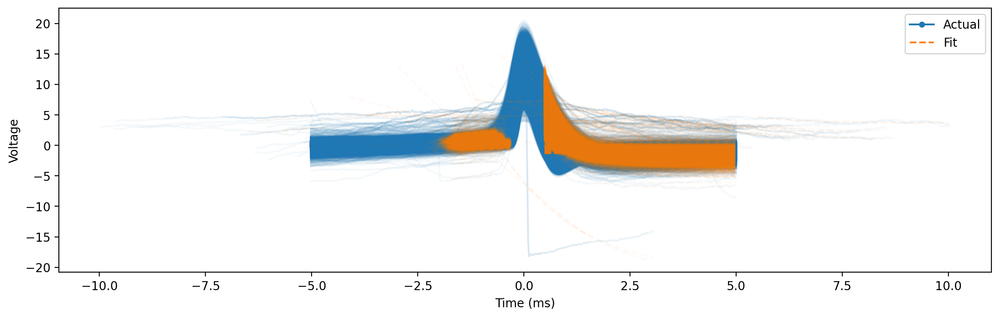

In [11]:
sp.plot()

### Filter spikes 

In [12]:
sp.filter_features()  

### Get spike dataframe (with spike times column)

In [13]:

df_features = sp.df_features

#add columns for spike times, both in idx and ms
df_features['spk_times_idx'] = sp.spike_inds
df_features['spk_times_ms'] = patch_times[sp.spike_inds]
df_features['spk_id'] = range(len(df_features))

In [14]:
df_features

,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,log_isi,spk_times_idx,spk_times_ms,spk_id
0,0.030786,0.28,0.200051,7.895348,0.30,2.490041,0.000026,-0.880492,1.824179,53650,1.072487e+03,0
1,0.185567,0.26,0.442928,7.949770,0.30,2.641294,0.000002,-0.294561,1.631439,56987,1.139196e+03,1
2,0.877363,0.26,0.629470,7.800408,0.32,2.410221,0.000010,-0.435603,1.717796,59128,1.181995e+03,2
3,-0.052398,0.28,0.314866,7.699788,0.30,2.396309,0.000004,-0.445957,1.440387,61740,1.234210e+03,3
4,0.087457,0.28,0.582596,8.028814,0.32,2.347654,0.000003,-0.362595,1.215166,63119,1.261777e+03,4
...,...,...,...,...,...,...,...,...,...,...,...,...
12556,0.075823,0.38,0.147030,6.220482,0.40,1.113120,0.000015,-1.071736,1.615953,53934028,1.078165e+06,12547
12557,-0.070153,0.36,0.126203,6.108001,0.42,0.976829,0.000012,-0.968436,1.674837,53936094,1.078207e+06,12548
12558,0.116481,0.36,0.503001,6.513055,0.40,0.944731,0.000010,-0.534537,1.667992,53938460,1.078254e+06,12549
12559,0.036199,0.38,0.324115,6.458305,0.42,0.761761,0.000003,-0.770707,1.598364,53940789,1.078300e+06,12550


### Get spike times


In [15]:
spk_times_idx = df_features['spk_times_idx']
spk_times_ms = df_features['spk_times_ms']
spk_ids = df_features['spk_id']

In [16]:
df_features.columns

Index(['ramp_amp', 'inflection_time', 'inflection_amp', 'peak_amp',
       'peak_width', 'peak_sharpness', 'exp_lambda', 'exp_const', 'log_isi',
       'spk_times_idx', 'spk_times_ms', 'spk_id'],
      dtype='object')

## STEP 2: Cluster spike groups 

#### Plot distribution of all features

Plotting spike features...
Removing outliers using IQR method (multiplier=3)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


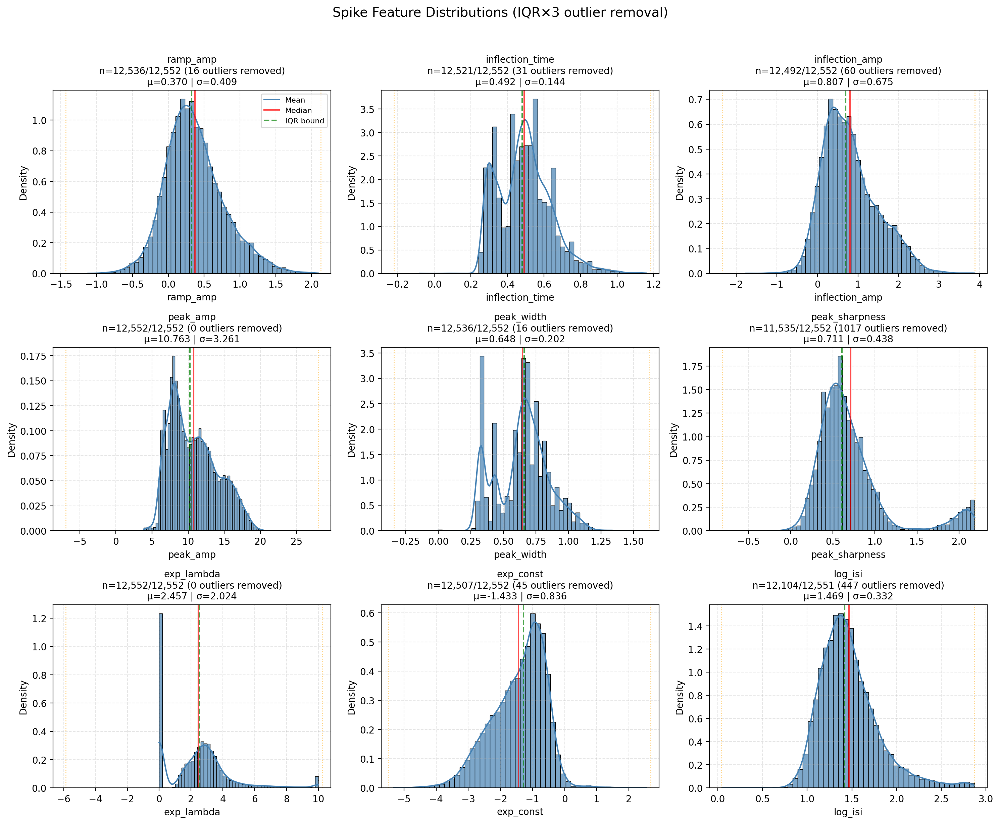


FEATURE DISTRIBUTION SUMMARY
Feature              Total N    Clean N    Outliers   % Removed  Mean       Std       
------------------------------------------------------------------------------------------
ramp_amp             12552      12536      16         0.1        0.370      0.409     
inflection_time      12552      12521      31         0.2        0.492      0.144     
inflection_amp       12552      12492      60         0.5        0.807      0.675     
peak_amp             12552      12552      0          0.0        10.763     3.261     
peak_width           12552      12536      16         0.1        0.648      0.202     
peak_sharpness       12552      11535      1017       8.1        0.711      0.438     
exp_lambda           12552      12552      0          0.0        2.457      2.024     
exp_const            12552      12507      45         0.4        -1.433     0.836     
log_isi              12551      12104      447        3.6        1.469      0.332     


In [17]:
plot_spike_feature_distributions(df_features)

ramp_amp: Skipped - k_suggest = 1
inflection_time: Skipped - k_suggest = 1
inflection_amp: Skipped - k_suggest = 1


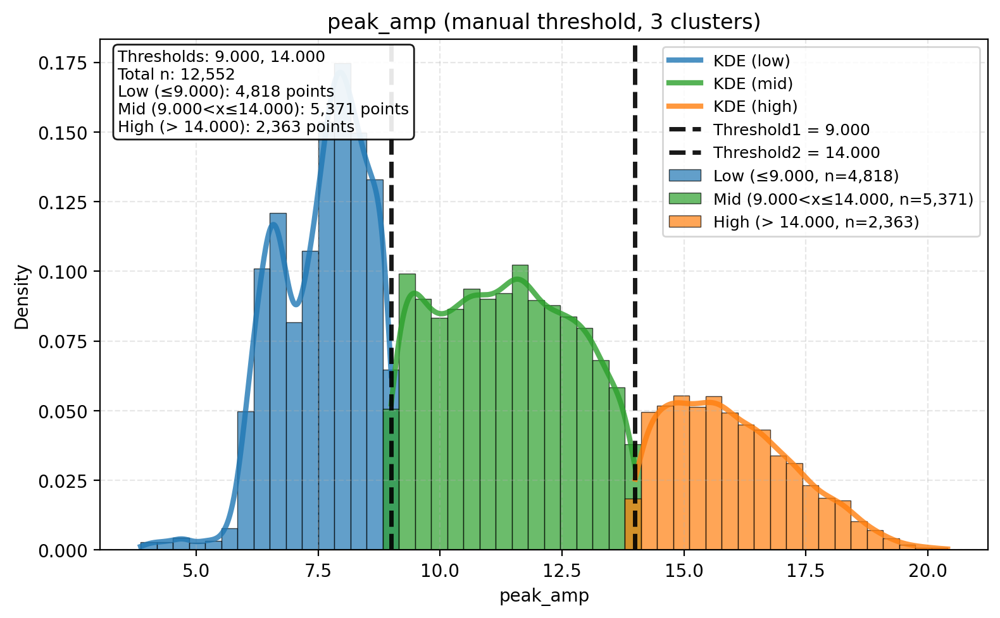

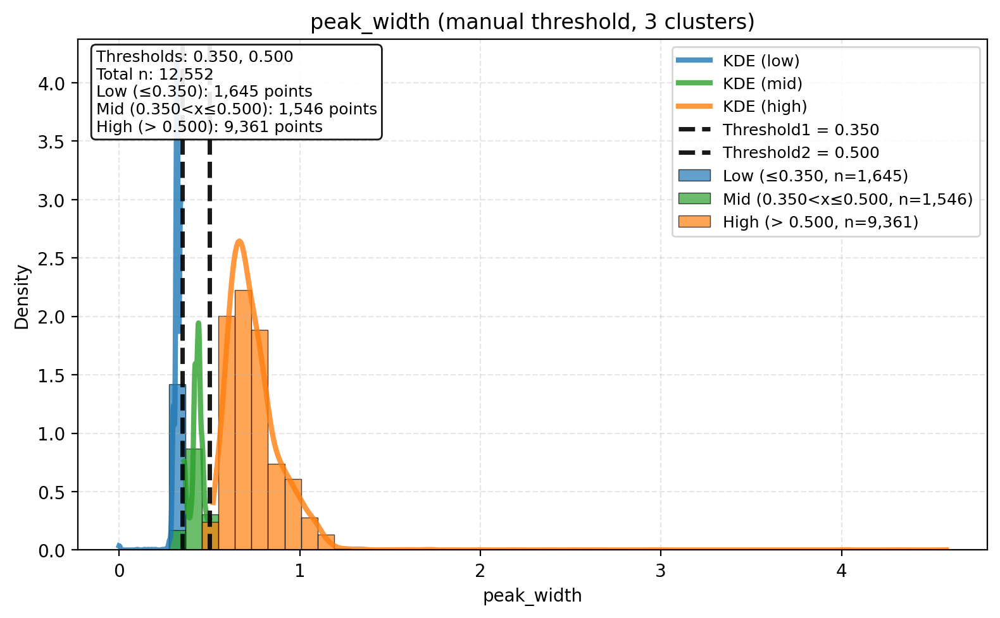

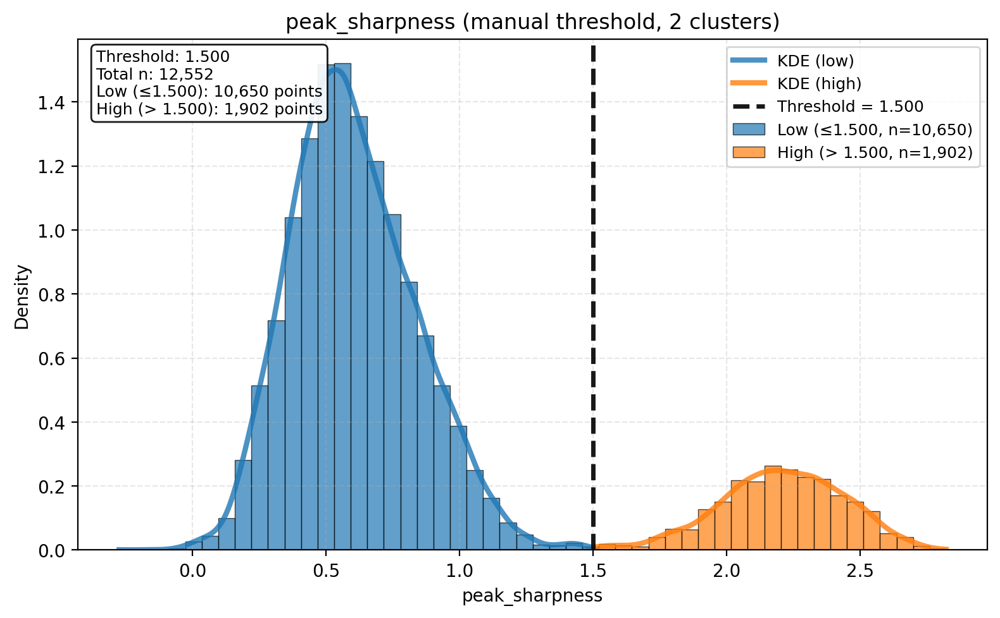

exp_lambda: Skipped - k_suggest = 1
exp_const: Skipped - k_suggest = 1
log_isi: Skipped - k_suggest = 1


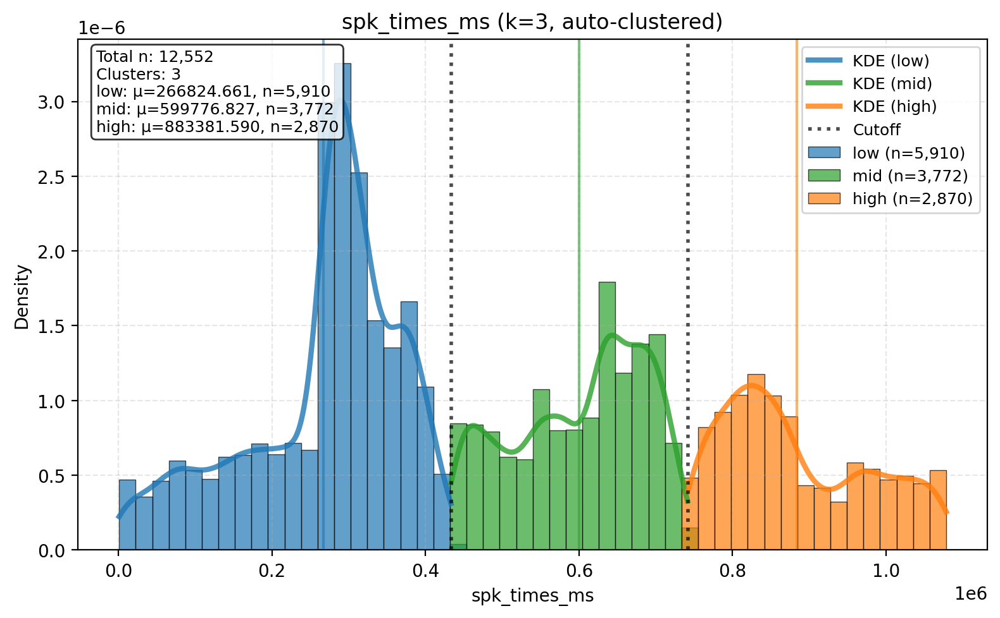

spk_id: Skipped - k_suggest = 1
  Saved: c21_cluster_df.pkl


In [18]:
cluster_pickle = os.path.join(SPE1_PICKLE_ROOT, 'cluster_pickles', f'c{cell_num}_cluster_df.pkl')

if FORCE_CLUSTER or not os.path.exists(cluster_pickle):
    # scan all numeric features and only cluster the ones that look multimodal
    df_features_clust, rep = cluster_multimodal_features(
        df_features.drop(["spk_times_idx"], axis = 1),
        max_k=3,
        suffix="_cluster",
        plot_each=True,  # set True if you want a quick plot per clustered feature, 
        manual_thresholds={'peak_amp':(9,14), 'peak_sharpness':1.5, 'peak_width':(0.35, 0.5)
        }
    )
    
    with open(cluster_pickle, 'wb') as f:
        pickle.dump(df_features_clust, f)
    print(f"  Saved: {os.path.basename(cluster_pickle)}")
else:
    print(f"  [cache] {os.path.basename(cluster_pickle)}")
    with open(cluster_pickle, 'rb') as f:
        df_features_clust = pickle.load(f)



===== CLUSTER REPORT: peak_amp_cluster =====
Found 3 clusters: ['high', 'low', 'mid']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low', 'mid']
  Groups: ('low', 'mid', 'high')
  Group names: ('Low', 'Mid', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:172: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/numpy-1.24.1-py3.9-macosx-10.9-x86_64.egg/numpy/lib/nanfunctions.py:1872: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


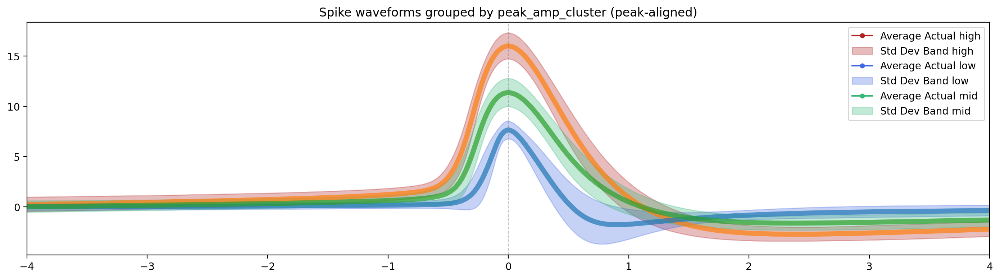


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:988: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


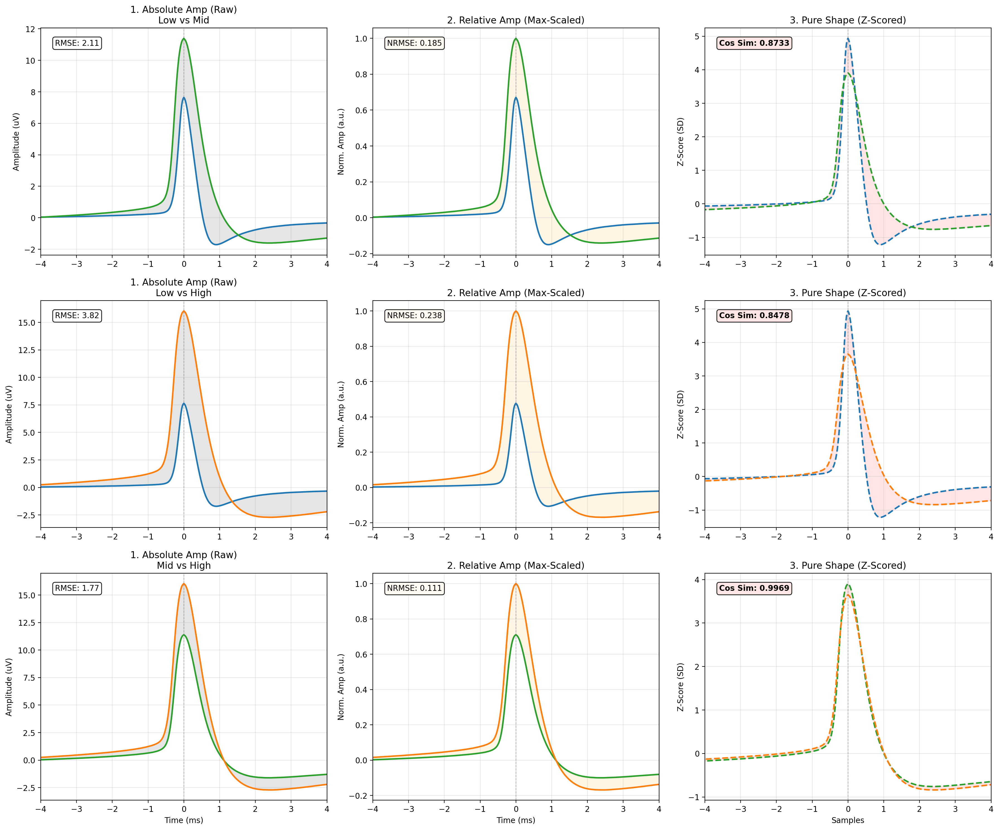


→ 2. Plotting cluster proportions over time


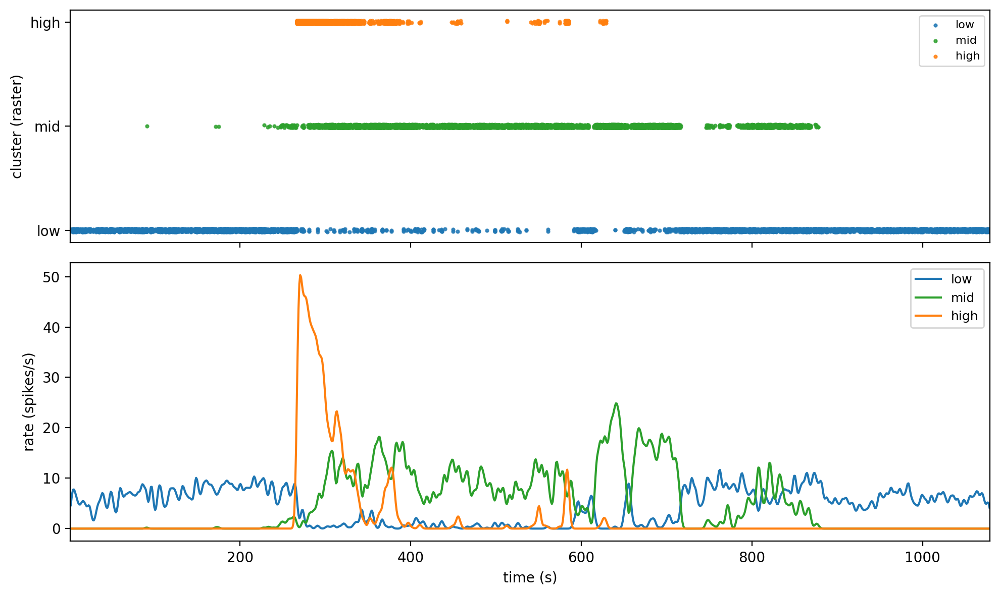


→ 3. Computing cluster transition matrix


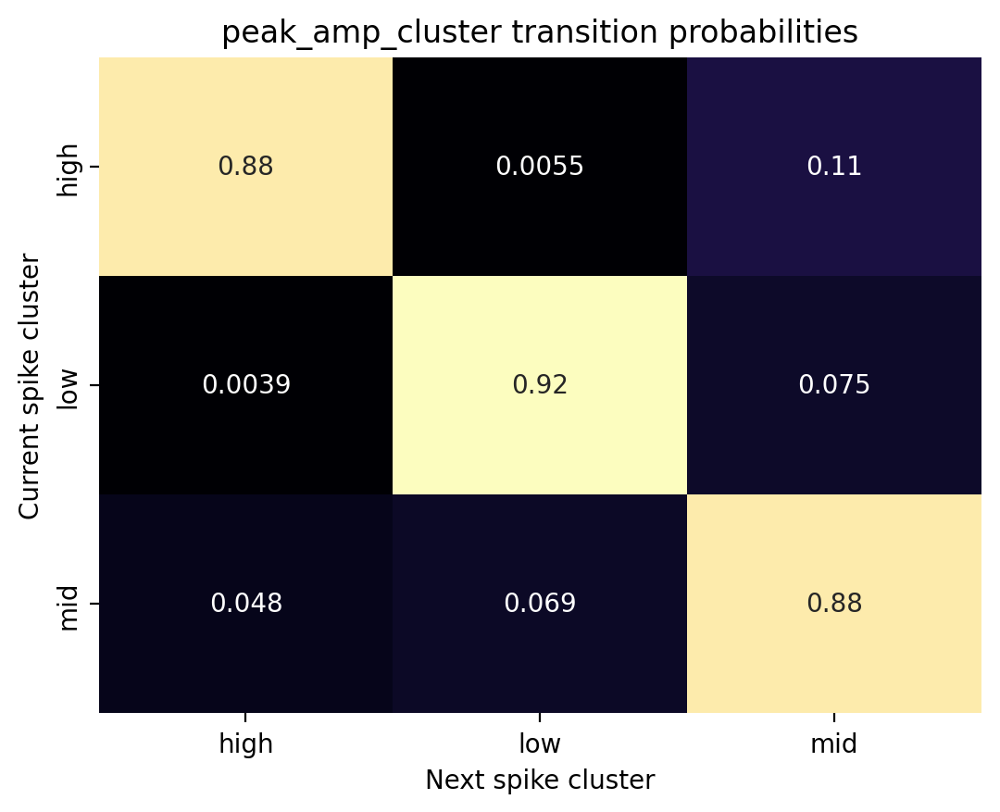


→ 4. Visualizing feature distributions by cluster


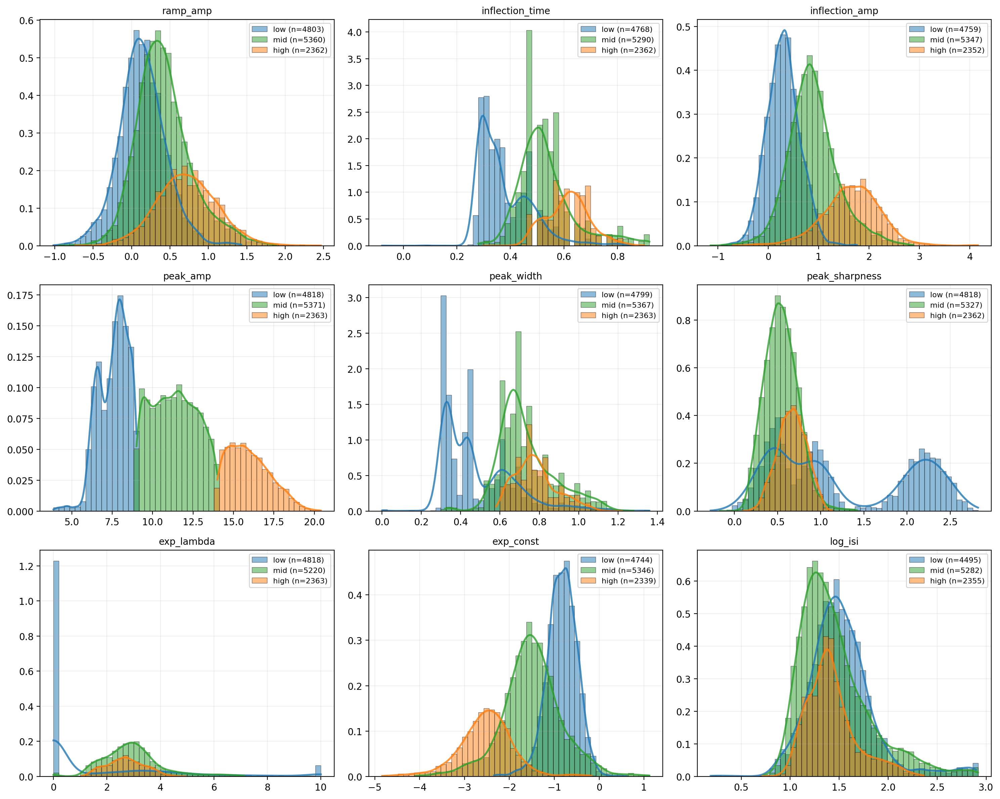


→ 5. Statistical analysis for: peak_amp
----------------------------------------

Test: Kruskal-Wallis (nonparametric)
Number of groups: 3
P-value: 0.000000
Significance: ***
η² effect size: 0.858
Interpretation: Very Large


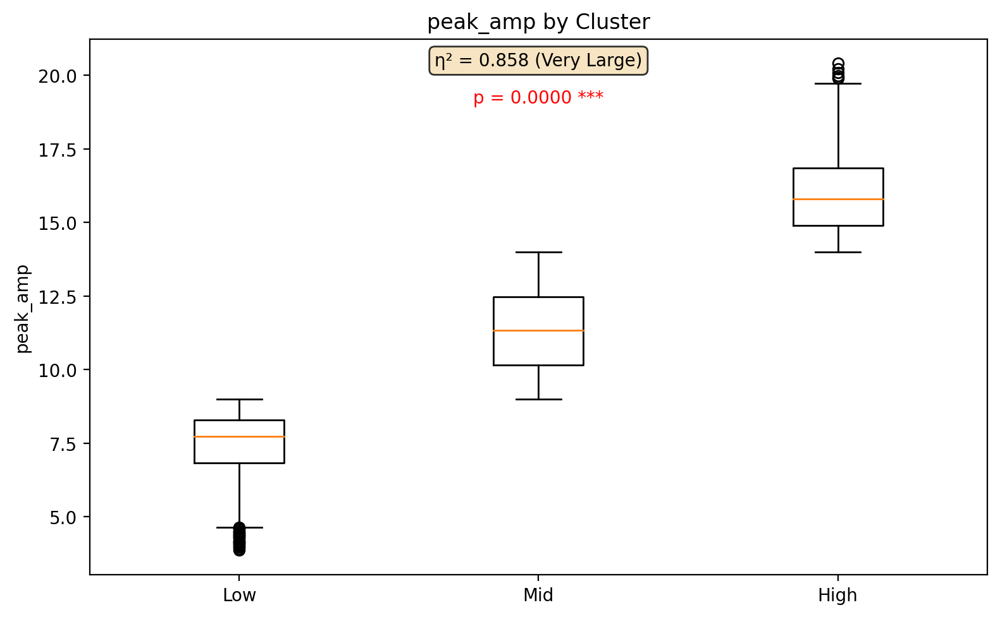


===== REPORT COMPLETE =====


===== CLUSTER REPORT: peak_width_cluster =====
Found 3 clusters: ['high', 'low', 'mid']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low', 'mid']
  Groups: ('low', 'mid', 'high')
  Group names: ('Low', 'Mid', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:172: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/numpy-1.24.1-py3.9-macosx-10.9-x86_64.egg/numpy/lib/nanfunctions.py:1872: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


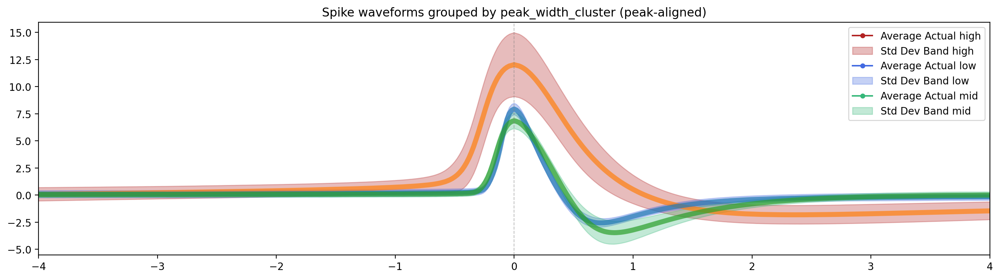


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:988: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


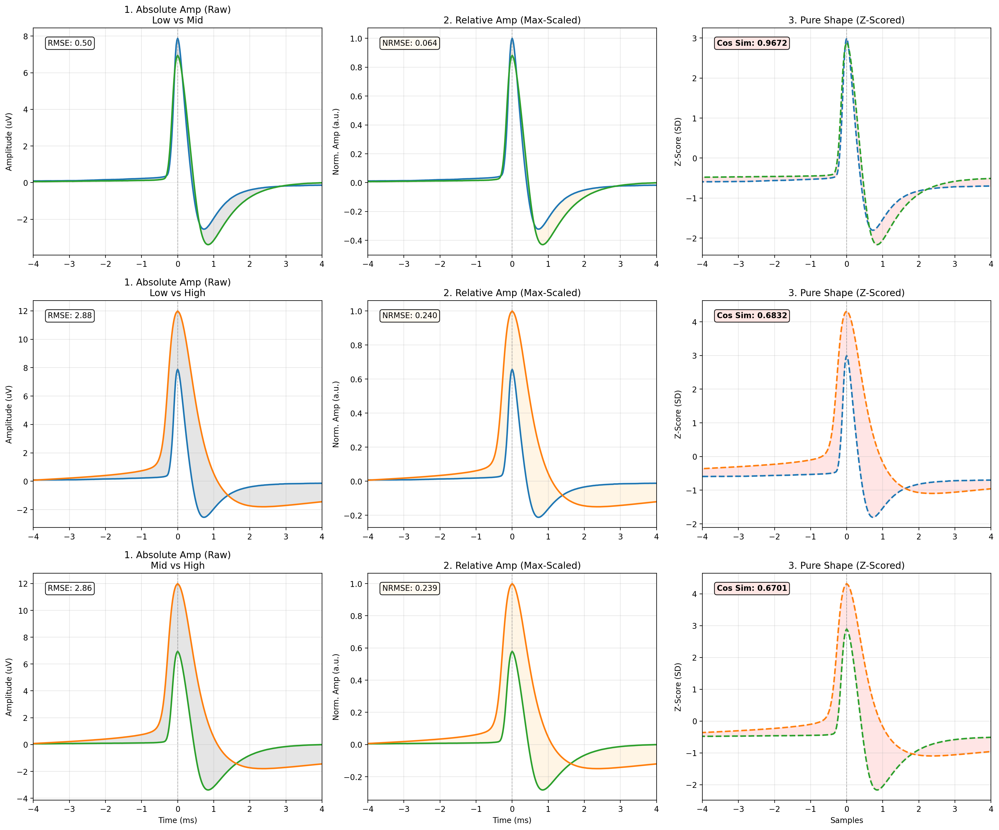


→ 2. Plotting cluster proportions over time


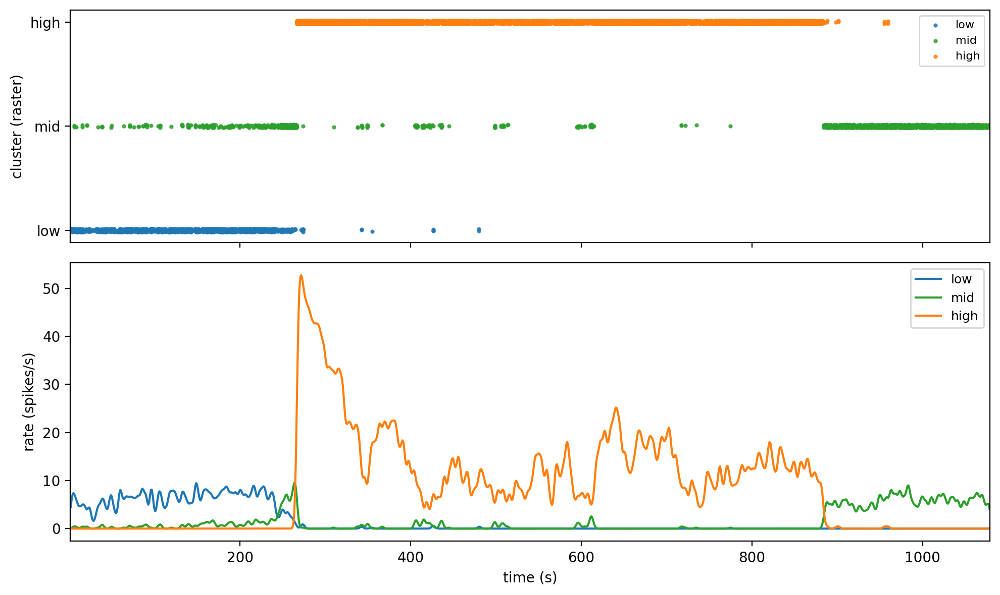


→ 3. Computing cluster transition matrix


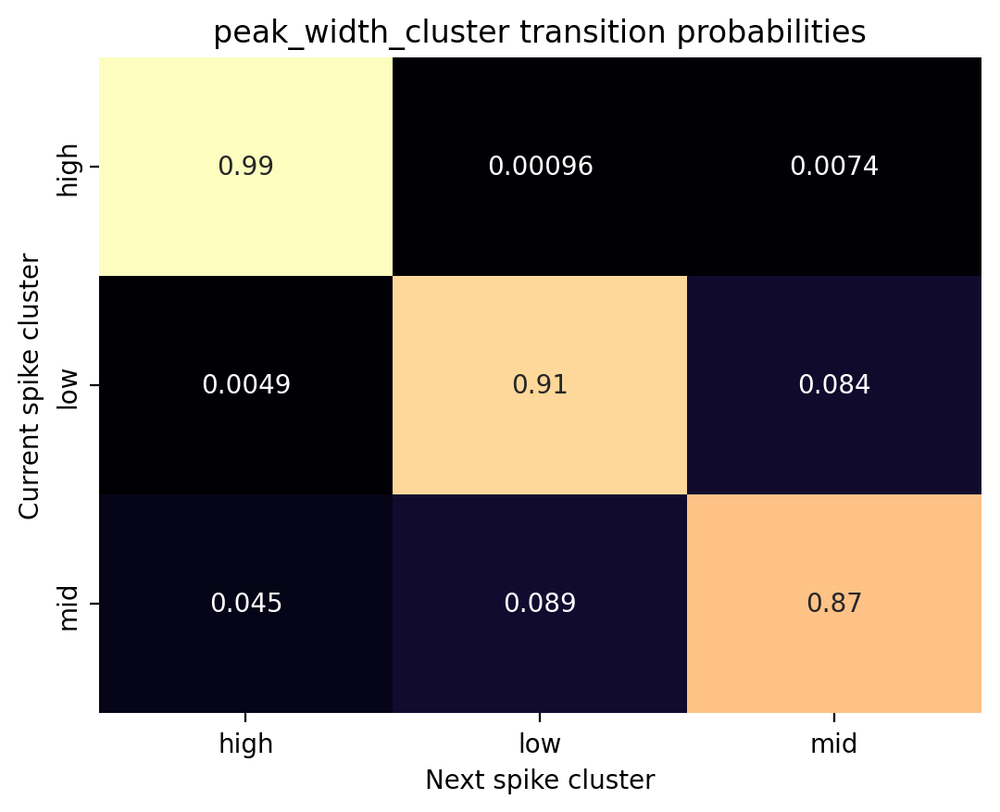


→ 4. Visualizing feature distributions by cluster


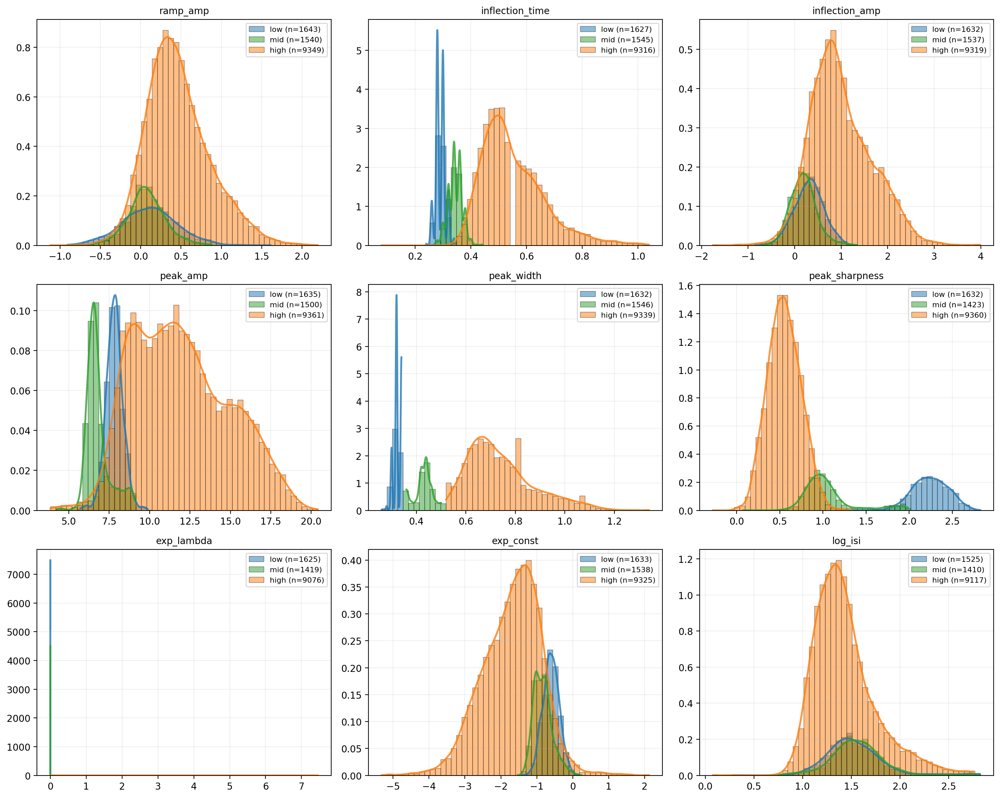


→ 5. Statistical analysis for: peak_width
----------------------------------------

Test: Kruskal-Wallis (nonparametric)
Number of groups: 3
P-value: 0.000000
Significance: ***
η² effect size: 0.582
Interpretation: Very Large


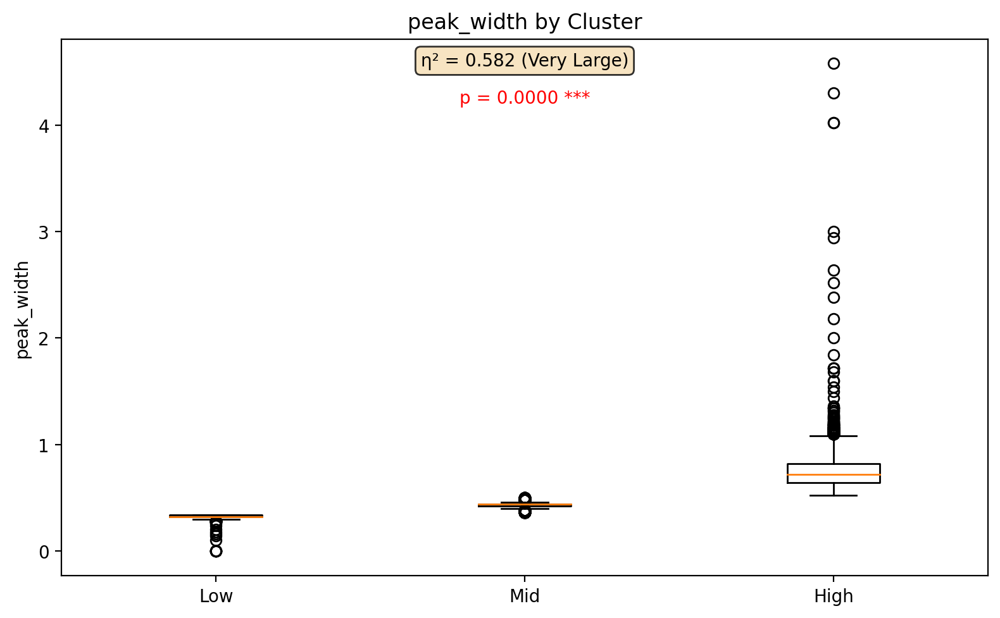


===== REPORT COMPLETE =====


===== CLUSTER REPORT: peak_sharpness_cluster =====
Found 2 clusters: ['high', 'low']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low']
  Groups: ('low', 'high')
  Group names: ('Low', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:172: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/numpy-1.24.1-py3.9-macosx-10.9-x86_64.egg/numpy/lib/nanfunctions.py:1872: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


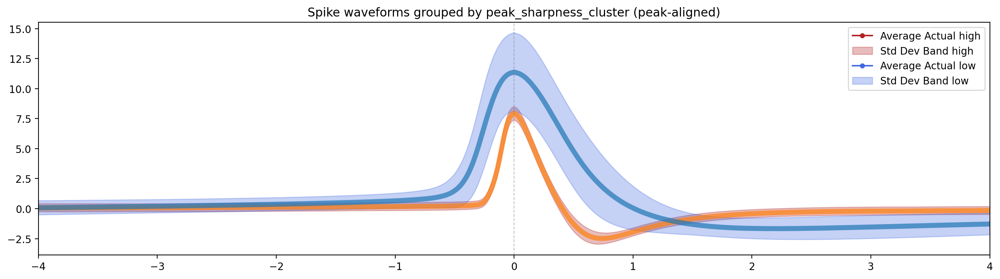


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:988: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


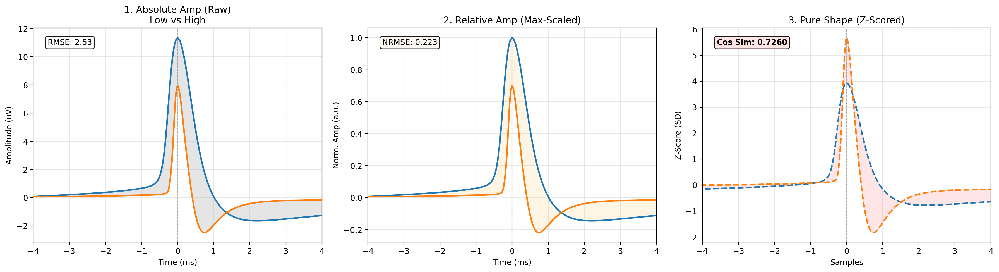


→ 2. Plotting cluster proportions over time


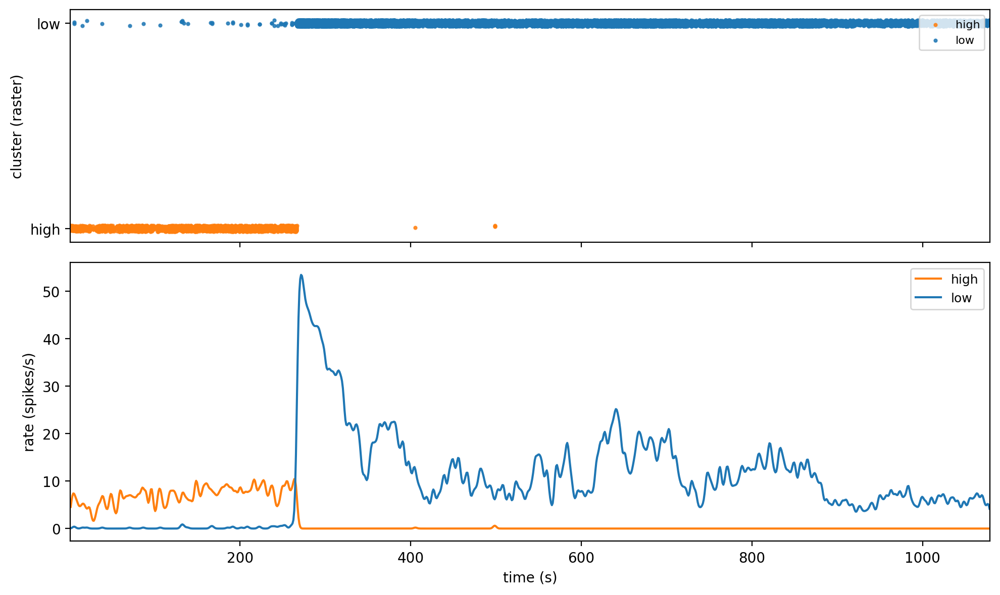


→ 3. Computing cluster transition matrix


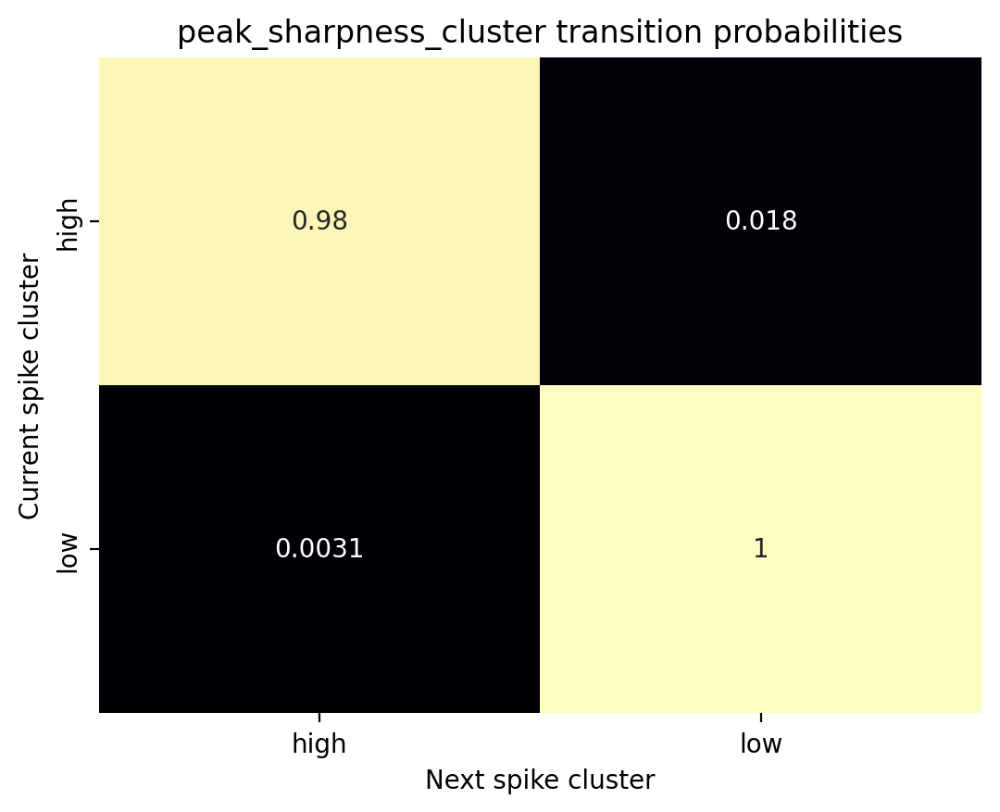


→ 4. Visualizing feature distributions by cluster


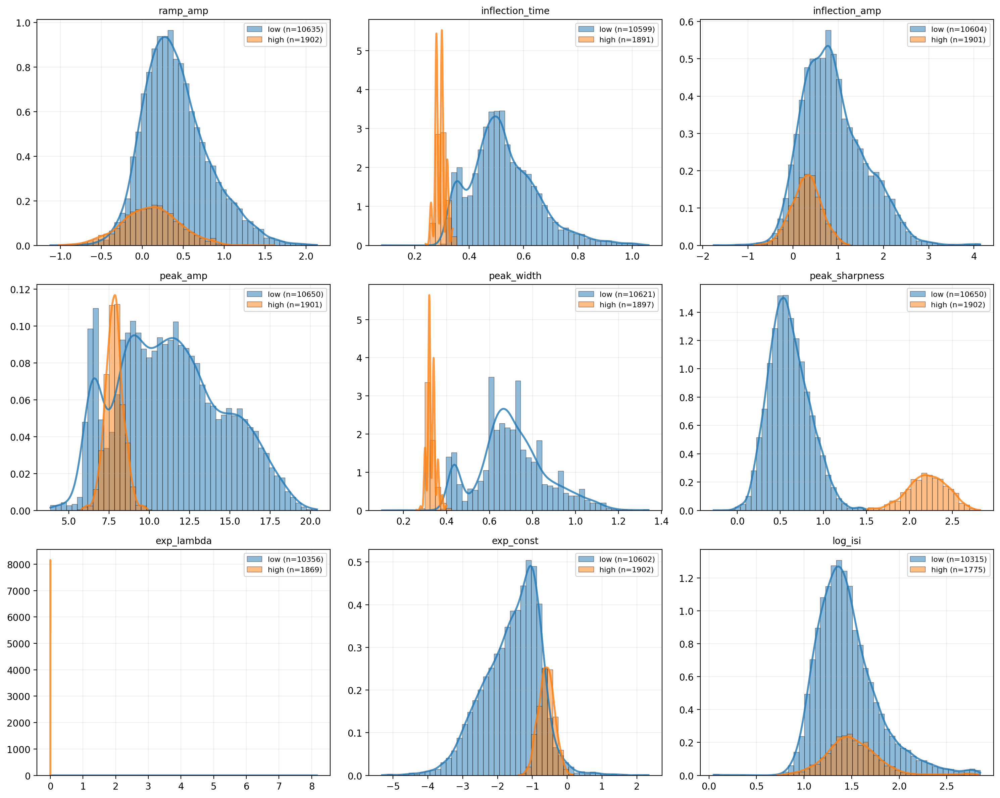


→ 5. Statistical analysis for: peak_sharpness
----------------------------------------

Test: Mann-Whitney U (nonparametric)
Number of groups: 2
P-value: 0.000000
Significance: ***
η² effect size: 0.859
Interpretation: Very Large


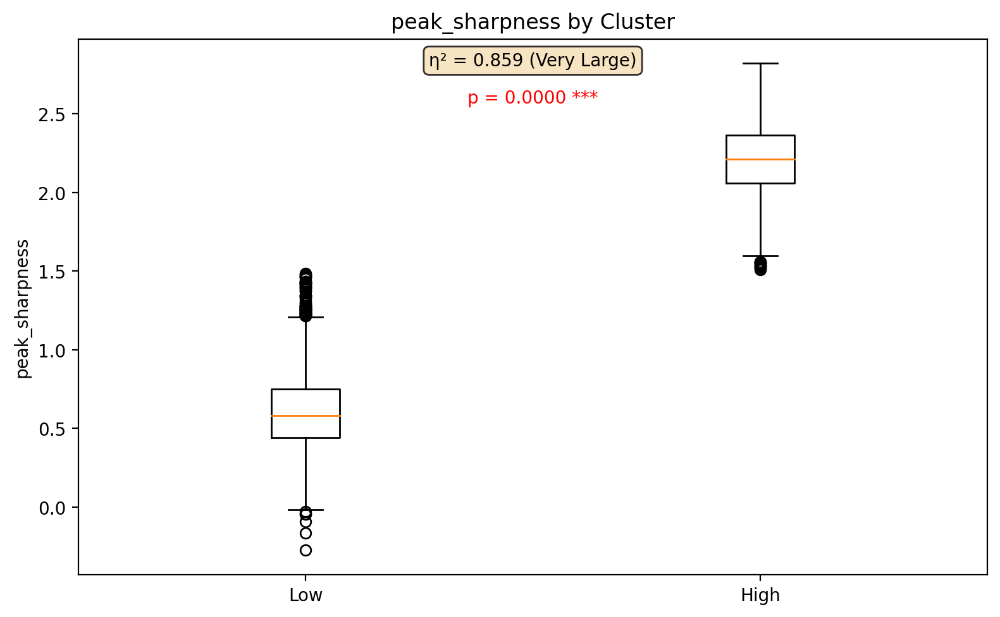


===== REPORT COMPLETE =====


===== CLUSTER REPORT: spk_times_ms_cluster =====
Found 3 clusters: ['high', 'low', 'mid']

→ Determining cluster colors and labels...
  Using existing cluster labels: ['high', 'low', 'mid']
  Groups: ('low', 'mid', 'high')
  Group names: ('Low', 'Mid', 'High')

→ 1. Plotting spike waveforms by cluster


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/spikeparam/patch/plts/plts.py:172: RuntimeWarning: Mean of empty slice
  avg_actual = np.nanmean(arr[:, :n], axis=0)
/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/numpy-1.24.1-py3.9-macosx-10.9-x86_64.egg/numpy/lib/nanfunctions.py:1872: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


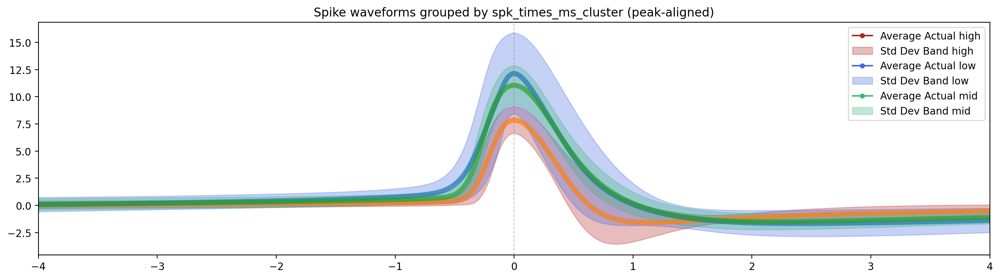


→ 1.5 Average waveforms with visual RMSE


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:988: RuntimeWarning: Mean of empty slice
  avg_waveforms[group]    = np.nanmean(arr, axis=0)


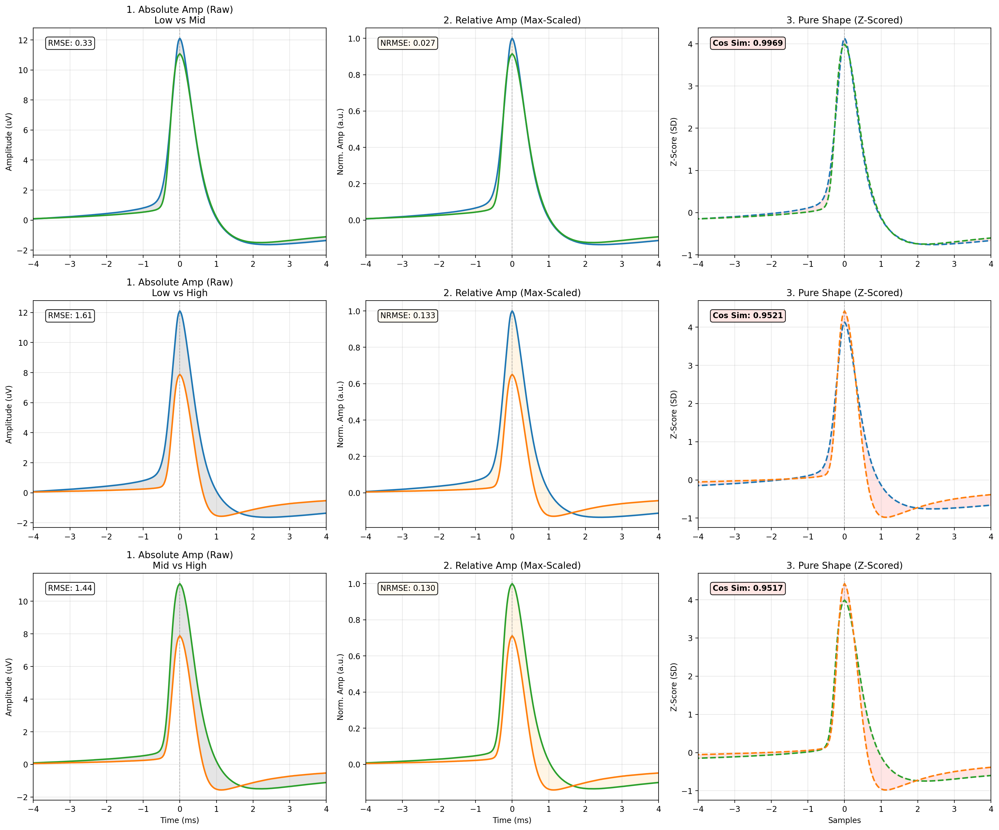


→ 2. Plotting cluster proportions over time


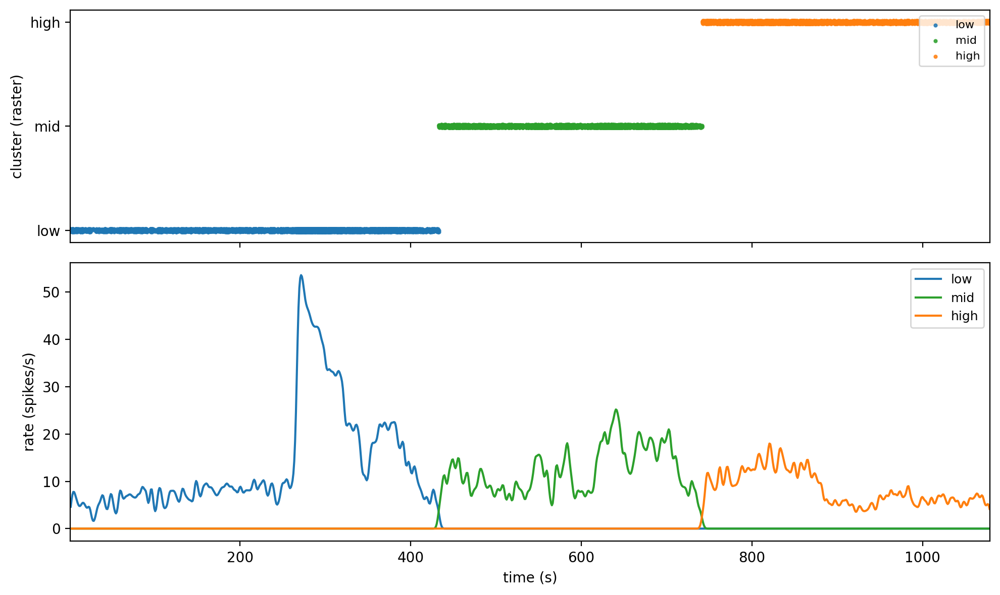


→ 3. Computing cluster transition matrix


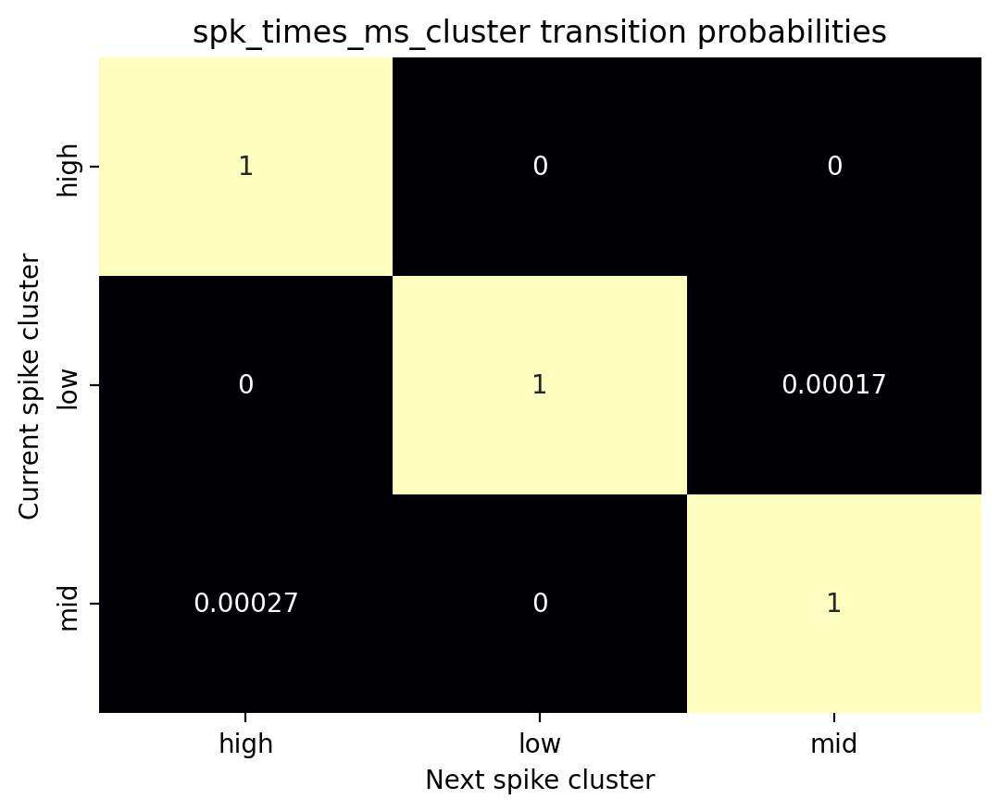


→ 4. Visualizing feature distributions by cluster


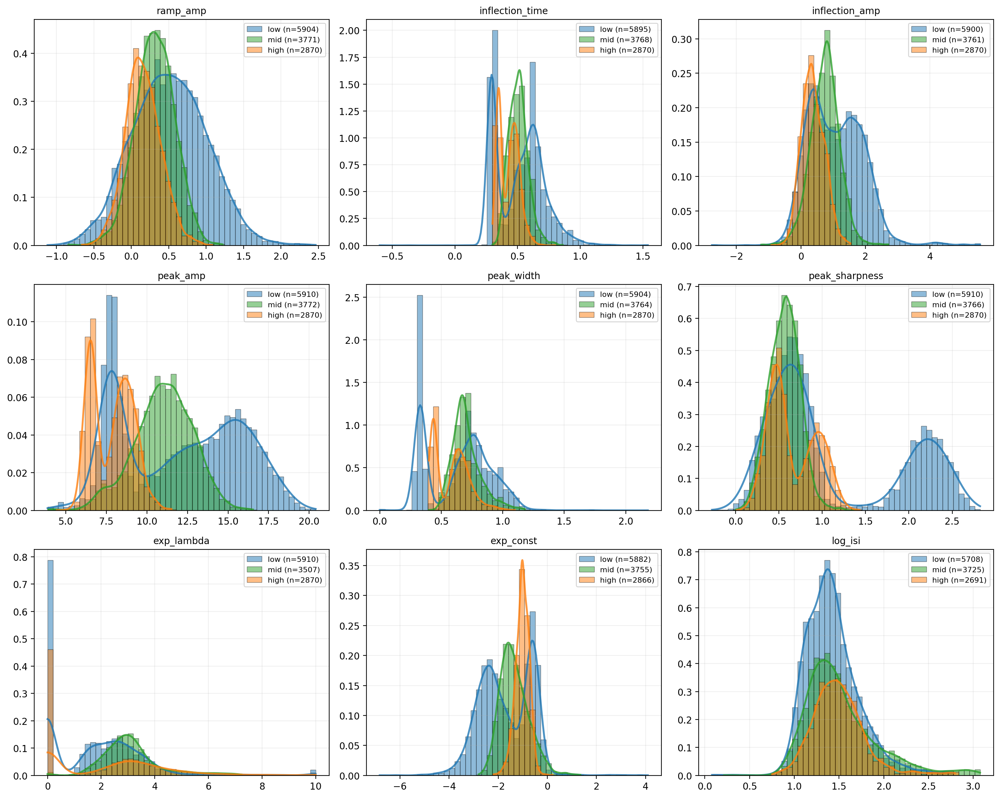


→ 5. Statistical analysis for: spk_times_ms
----------------------------------------

Test: Kruskal-Wallis (nonparametric)
Number of groups: 3
P-value: 0.000000
Significance: ***
η² effect size: 0.857
Interpretation: Very Large


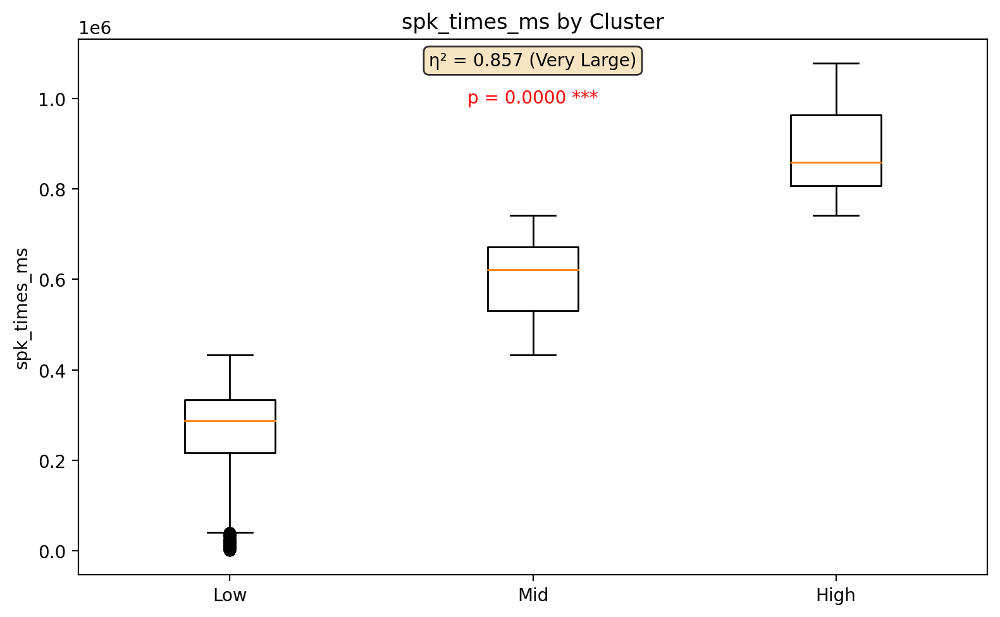


===== REPORT COMPLETE =====



In [19]:
all_reports = []

# Filter columns first to ensure the index is continuous
cluster_cols = [c for c in df_features_clust.columns if c.endswith("_cluster")]

for i, col in enumerate(cluster_cols):
    # Pass 'i' as the cluster_group_id
    row_df = plot_full_cluster_report(df_features_clust, sp, col, cluster_group_id=i)
    all_reports.append(row_df)

# Final Master DataFrame
master_report_df = pd.concat(all_reports, ignore_index=True)

In [20]:
# Save cluster quality report for population-level comparison analysis
report_pickle = os.path.join(SPE1_PICKLE_ROOT, 'cluster_pickles', f'c{cell_num}_cluster_report.pkl')
with open(report_pickle, 'wb') as f:
    pickle.dump(master_report_df, f)


In [21]:
# Compute and save peak-aligned average waveforms for each cluster group.
# Saved to a lightweight pickle used by the population comparison notebook.
wf_pickle = os.path.join(SPE1_PICKLE_ROOT, 'cluster_pickles', f'c{cell_num}_cluster_waveforms.pkl')
if FORCE_CLUSTER or not os.path.exists(wf_pickle):
    cluster_cols = [c for c in df_features_clust.columns if c.endswith('_cluster')]
    wf_data = compute_cluster_waveforms(sp, df_features_clust, cluster_cols)
    with open(wf_pickle, 'wb') as f:
        pickle.dump(wf_data, f)
    print(f"  Saved: {os.path.basename(wf_pickle)}")
else:
    print(f"  [cache] {os.path.basename(wf_pickle)}")


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:183: RuntimeWarning: Mean of empty slice
  "mean": np.nanmean(arr, axis=0),
/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/numpy-1.24.1-py3.9-macosx-10.9-x86_64.egg/numpy/lib/nanfunctions.py:1872: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:183: RuntimeWarning: Mean of empty slice
  "mean": np.nanmean(arr, axis=0),
/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/numpy-1.24.1-py3.9-macosx-10.9-x86_64.egg/numpy/lib/nanfunctions.py:1872: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:183: RuntimeWarning: Mean of empty slice
  "mean": np.nanmean(arr, axis=0),
/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/numpy-1.24.1-py3.9-macosx-10.9-x86_64.egg/numpy/lib/nanfunctions.py:1872: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


  Saved: c21_cluster_waveforms.pkl


/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/AP_empirical_paper1/datasets/spe-1/spe1_helper_modules/spk_feat_cluster_analysis.py:183: RuntimeWarning: Mean of empty slice
  "mean": np.nanmean(arr, axis=0),
/Users/blancamartin/opt/anaconda3/lib/python3.9/site-packages/numpy-1.24.1-py3.9-macosx-10.9-x86_64.egg/numpy/lib/nanfunctions.py:1872: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


#### Open all pickle chunks and reassamble 

#### Analyze by group

#### Plot avg specparam for each group for significant windows 